# Capstone Project - PROPERTY PRICE PREDICTION

## Problem Statement

A property value is simply more than location and square footage. Like the features that make up a  person, an educated party would want to know all aspects that give a property its value. For  example, you want to sell a property and you don’t know the price which you may expect — it can’t  be too low or too high. To find property price you usually try to find similar properties in your  neighborhood and based on gathered data you will try to assess your property price.

Objective:

Take advantage of all of the feature variables available below, use it to analyse and predict property  prices.  

cid: a notation for a property<br>
dayhours: Date property was sold<br>
price: Price is prediction target<br>
room_bed: Number of Bedrooms/property<br>
room_bath: Number of bathrooms/bedrooms<br>
living_measure: square footage of the home<br>
lot_measure: quare footage of the lot<br>
ceil: Total floors (levels) in property<br>
coast: property which has a view to a waterfront<br>
sight: Has been viewed<br>
condition: How good the condition is (Overall)<br>
quality: grade given to the housing unit, based on grading system<br>
ceil_measure: square footage of property apart from basement<br>
basement_measure: square footage of the basement<br>
yr_built: Built Year<br>
yr_renovated: Year when property was renovated<br>
zipcode: zip<br>
lat: Latitude coordinate<br>
long: Longitude coordinate<br>
living_measure15: Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area<br>
lot_measure15: lotSize area in 2015(implies-- some renovations)<br>
furnished: Based on the quality of room<br>
total_area: Measure of both living and lot<br>


## Description

Develop a predictive model for property pricing using various features such as location, square footage, and property condition.
The model will analyze data including room details, lot size, and renovation history to provide accurate price estimates,
helping sellers set competitive prices and buyers make informed decisions.

## Importing Libraries and loading Dataset

In [ ]:
# loading the library required for data loading and processing
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,10)
import seaborn as sns
import sklearn

#Supress warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
print('Numpy Version',np.__version__)
print('Pandas Version',pd.__version__)
print('Seaborn Version',sns.__version__)
print('Matplotlib Version',matplotlib.__version__)
print('Sklearn Version', sklearn.__version__)

Numpy Version 1.23.5
Pandas Version 1.5.3
Seaborn Version 0.12.2
Matplotlib Version 3.7.0
Sklearn Version 1.2.1


In [ ]:
pd.options.display.max_columns = None
property_df=pd.read_excel('innercity.xlsx')
property_df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


In [ ]:
property_df.shape

(21613, 23)

We have more than 21k records and 23 features

In [ ]:
property_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

Total records are 21613 out of which few features contains null values, we need to handle them

In [ ]:
property_df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

## Data Cleaning and Preprocessing

In [ ]:
#Drop unnecessary features from dataset
property_df = property_df.drop(['cid', 'dayhours','zipcode','lat', 'long'],axis='columns')
property_df.shape

(21613, 18)

In [ ]:
# Let's check whether there's any duplicate records in our dataset
property_df.duplicated().sum()

6

In [ ]:
#Lets drop duplicate records
property_df=property_df.drop_duplicates()
print("Shape of Dataset after removing duplicates:",property_df.shape)

Shape of Dataset after removing duplicates: (21607, 18)


In [ ]:
property_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21607 entries, 0 to 21612
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21607 non-null  int64  
 1   room_bed          21499 non-null  float64
 2   room_bath         21499 non-null  float64
 3   living_measure    21590 non-null  float64
 4   lot_measure       21565 non-null  float64
 5   ceil              21565 non-null  object 
 6   coast             21606 non-null  object 
 7   sight             21550 non-null  float64
 8   condition         21550 non-null  object 
 9   quality           21606 non-null  float64
 10  ceil_measure      21606 non-null  float64
 11  basement          21606 non-null  float64
 12  yr_built          21606 non-null  object 
 13  yr_renovated      21607 non-null  int64  
 14  living_measure15  21441 non-null  float64
 15  lot_measure15     21578 non-null  float64
 16  furnished         21578 non-null  float6

ceil,coast,condition,yr_built and total area are of object datatypes. we need to convert them to integer/float

In [ ]:
#Lets convert object columns to integer/Float datatype
property_df['ceil']=pd.to_numeric(property_df['ceil'], errors='coerce')
property_df['coast']=pd.to_numeric(property_df['coast'], errors='coerce')
property_df['condition']=pd.to_numeric(property_df['condition'], errors='coerce')
property_df['yr_built']=pd.to_numeric(property_df['yr_built'], errors='coerce')
property_df['total_area']=pd.to_numeric(property_df['total_area'], errors='coerce')

In [ ]:
property_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21607 entries, 0 to 21612
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21607 non-null  int64  
 1   room_bed          21499 non-null  float64
 2   room_bath         21499 non-null  float64
 3   living_measure    21590 non-null  float64
 4   lot_measure       21565 non-null  float64
 5   ceil              21535 non-null  float64
 6   coast             21576 non-null  float64
 7   sight             21550 non-null  float64
 8   condition         21522 non-null  float64
 9   quality           21606 non-null  float64
 10  ceil_measure      21606 non-null  float64
 11  basement          21606 non-null  float64
 12  yr_built          21592 non-null  float64
 13  yr_renovated      21607 non-null  int64  
 14  living_measure15  21441 non-null  float64
 15  lot_measure15     21578 non-null  float64
 16  furnished         21578 non-null  float6

In [ ]:
#Lets drop sight feature as number of sight visits is not important
property_df = property_df.drop(['sight'],axis='columns')
property_df.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,condition,quality,ceil_measure,basement,yr_built,yr_renovated,living_measure15,lot_measure15,furnished,total_area
0,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,2020.0,8660.0,0.0,12490.0
1,190000,2.0,1.00,670.0,3101.0,1.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,1660.0,4100.0,0.0,3771.0
2,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,3.0,8.0,3040.0,0.0,1966.0,0,2620.0,2433.0,0.0,5455.0
3,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,2030.0,3794.0,0.0,5461.0
4,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,1120.0,5100.0,0.0,5710.0


In [ ]:
#Lets handle missing and junk values

median_cols=['room_bed','room_bath','living_measure15','lot_measure15','ceil','yr_built','condition','quality','ceil_measure','basement']
mode_cols=['coast','furnished']

def clean_cols_median(property_df, median_cols):
    for col in median_cols:
        # Check for blank or junk values ('$' or '?') and set them to NaN
        property_df[col] = property_df[col].replace(['$', ''], np.nan)

        # Check if the column has any null values
        if property_df[col].isnull().any():
            # Calculate the median of the column, rounding to 2 decimal places
            median_value = round(property_df[col].median(), 2)
            # Replace null values with the median
            property_df[col].fillna(median_value, inplace=True)

    return property_df

def clean_cols_mode(property_df, mode_cols):
    for col in mode_cols:
        # Check for blank or junk values ('$' or '?') and set them to NaN
        property_df[col] = property_df[col].replace(['$', ''], np.nan)

        # Check if the column has any null values
        if property_df[col].isnull().any():
            # Calculate the mode of the column, rounding to 2 decimal places
            median_value = property_df[col].mode()[0]
            # Replace null values with the median
            property_df[col].fillna(median_value, inplace=True)

    return property_df

property_df=clean_cols_median(property_df,median_cols)
property_df=clean_cols_mode(property_df,mode_cols)

In [ ]:
#Lets check for null values
property_df.isna().sum()

price                0
room_bed             0
room_bath            0
living_measure      17
lot_measure         42
ceil                 0
coast                0
condition            0
quality              0
ceil_measure         0
basement             0
yr_built             0
yr_renovated         0
living_measure15     0
lot_measure15        0
furnished            0
total_area          68
dtype: int64

As we have livingmeausre and lotmeasure values in 2015, previous values are no longer needed. Ignore the null values for livingmeasure, lot measure and total area features

## Feature Engineering

In [ ]:
#Lets create new column named "Property_Age" which is equal to 2015-yr_built as the data collected was on 2015
property_df['Property_Age']=2015-property_df['yr_built']
property_df.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,condition,quality,ceil_measure,basement,yr_built,yr_renovated,living_measure15,lot_measure15,furnished,total_area,Property_Age
0,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,2020.0,8660.0,0.0,12490.0,49.0
1,190000,2.0,1.00,670.0,3101.0,1.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,1660.0,4100.0,0.0,3771.0,67.0
2,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,3.0,8.0,3040.0,0.0,1966.0,0,2620.0,2433.0,0.0,5455.0,49.0
3,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,2030.0,3794.0,0.0,5461.0,6.0
4,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,1120.0,5100.0,0.0,5710.0,91.0


Now we will update the Property_Age values with respective to below condition<br>
<=10      New_Property<br>
10-30     MediumAge_Property<br>
30-50     HighAge_Property<br>
50+       Vintage_Property<br>

In [ ]:
#Update Property_Age values with above categories
conditions=[
    (property_df['Property_Age']<=10),
    ((property_df['Property_Age']>10) & (property_df['Property_Age']<=30)),
    ((property_df['Property_Age']>30) & (property_df['Property_Age']<=50)),
    (property_df['Property_Age']>50)
]

choices=["New_Property","MediumAge_Property","HighAge_Property","Vintage_Property"]

property_df['Property_Age']=np.select(conditions,choices,default='Unknown')

In [ ]:
#Lets drop yr_built feature as its no longer required
property_df = property_df.drop(['yr_built'],axis='columns')
property_df.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,condition,quality,ceil_measure,basement,yr_renovated,living_measure15,lot_measure15,furnished,total_area,Property_Age
0,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,3.0,8.0,1800.0,1250.0,0,2020.0,8660.0,0.0,12490.0,HighAge_Property
1,190000,2.0,1.00,670.0,3101.0,1.0,0.0,4.0,6.0,670.0,0.0,0,1660.0,4100.0,0.0,3771.0,Vintage_Property
2,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,3.0,8.0,3040.0,0.0,0,2620.0,2433.0,0.0,5455.0,HighAge_Property
3,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,3.0,8.0,1740.0,0.0,0,2030.0,3794.0,0.0,5461.0,New_Property
4,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,3.0,7.0,1120.0,0.0,0,1120.0,5100.0,0.0,5710.0,Vintage_Property


In [ ]:
#Create new column named "Renovated" and substitute 1 if renovated, else 0
property_df['Renovated']=np.where(property_df["yr_renovated"]>0,1,0)

In [ ]:
#Lets drop yr_renovated feature as its no longer required
property_df = property_df.drop(['yr_renovated'],axis='columns')
property_df.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,total_area,Property_Age,Renovated
0,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,3.0,8.0,1800.0,1250.0,2020.0,8660.0,0.0,12490.0,HighAge_Property,0
1,190000,2.0,1.00,670.0,3101.0,1.0,0.0,4.0,6.0,670.0,0.0,1660.0,4100.0,0.0,3771.0,Vintage_Property,0
2,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,3.0,8.0,3040.0,0.0,2620.0,2433.0,0.0,5455.0,HighAge_Property,0
3,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,3.0,8.0,1740.0,0.0,2030.0,3794.0,0.0,5461.0,New_Property,0
4,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,3.0,7.0,1120.0,0.0,1120.0,5100.0,0.0,5710.0,Vintage_Property,0


In [ ]:
#Create new column total_area15 which equals to the sum of living_measure15 and lot_measure15
property_df["total_area15"]=property_df["living_measure15"] + property_df["lot_measure15"]
property_df.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,total_area,Property_Age,Renovated,total_area15
0,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,3.0,8.0,1800.0,1250.0,2020.0,8660.0,0.0,12490.0,HighAge_Property,0,10680.0
1,190000,2.0,1.00,670.0,3101.0,1.0,0.0,4.0,6.0,670.0,0.0,1660.0,4100.0,0.0,3771.0,Vintage_Property,0,5760.0
2,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,3.0,8.0,3040.0,0.0,2620.0,2433.0,0.0,5455.0,HighAge_Property,0,5053.0
3,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,3.0,8.0,1740.0,0.0,2030.0,3794.0,0.0,5461.0,New_Property,0,5824.0
4,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,3.0,7.0,1120.0,0.0,1120.0,5100.0,0.0,5710.0,Vintage_Property,0,6220.0


In [ ]:
#Lets drop living_measure,lot_measure and total_area features as they are old records and not needed
property_df = property_df.drop(['living_measure','lot_measure','total_area'],axis='columns')
property_df.head()

,price,room_bed,room_bath,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,Property_Age,Renovated,total_area15
0,600000,4.0,1.75,1.0,0.0,3.0,8.0,1800.0,1250.0,2020.0,8660.0,0.0,HighAge_Property,0,10680.0
1,190000,2.0,1.00,1.0,0.0,4.0,6.0,670.0,0.0,1660.0,4100.0,0.0,Vintage_Property,0,5760.0
2,735000,4.0,2.75,2.0,1.0,3.0,8.0,3040.0,0.0,2620.0,2433.0,0.0,HighAge_Property,0,5053.0
3,257000,3.0,2.50,2.0,0.0,3.0,8.0,1740.0,0.0,2030.0,3794.0,0.0,New_Property,0,5824.0
4,450000,2.0,1.00,1.0,0.0,3.0,7.0,1120.0,0.0,1120.0,5100.0,0.0,Vintage_Property,0,6220.0


In [ ]:
#Create new feature "price_per_sqft" and divide the price by total_area15
property_df['price_per_sqft'] = property_df['price']/property_df['total_area15']
property_df['price_per_sqft'] = property_df['price_per_sqft'].round(2)
property_df.head()

,price,room_bed,room_bath,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,Property_Age,Renovated,total_area15,price_per_sqft
0,600000,4.0,1.75,1.0,0.0,3.0,8.0,1800.0,1250.0,2020.0,8660.0,0.0,HighAge_Property,0,10680.0,56.18
1,190000,2.0,1.00,1.0,0.0,4.0,6.0,670.0,0.0,1660.0,4100.0,0.0,Vintage_Property,0,5760.0,32.99
2,735000,4.0,2.75,2.0,1.0,3.0,8.0,3040.0,0.0,2620.0,2433.0,0.0,HighAge_Property,0,5053.0,145.46
3,257000,3.0,2.50,2.0,0.0,3.0,8.0,1740.0,0.0,2030.0,3794.0,0.0,New_Property,0,5824.0,44.13
4,450000,2.0,1.00,1.0,0.0,3.0,7.0,1120.0,0.0,1120.0,5100.0,0.0,Vintage_Property,0,6220.0,72.35


In [ ]:
property_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21607 entries, 0 to 21612
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21607 non-null  int64  
 1   room_bed          21607 non-null  float64
 2   room_bath         21607 non-null  float64
 3   ceil              21607 non-null  float64
 4   coast             21607 non-null  float64
 5   condition         21607 non-null  float64
 6   quality           21607 non-null  float64
 7   ceil_measure      21607 non-null  float64
 8   basement          21607 non-null  float64
 9   living_measure15  21607 non-null  float64
 10  lot_measure15     21607 non-null  float64
 11  furnished         21607 non-null  float64
 12  Property_Age      21607 non-null  object 
 13  Renovated         21607 non-null  int32  
 14  total_area15      21607 non-null  float64
 15  price_per_sqft    21607 non-null  float64
dtypes: float64(13), int32(1), int64(1), obje

Text(0.5, 0, 'price')

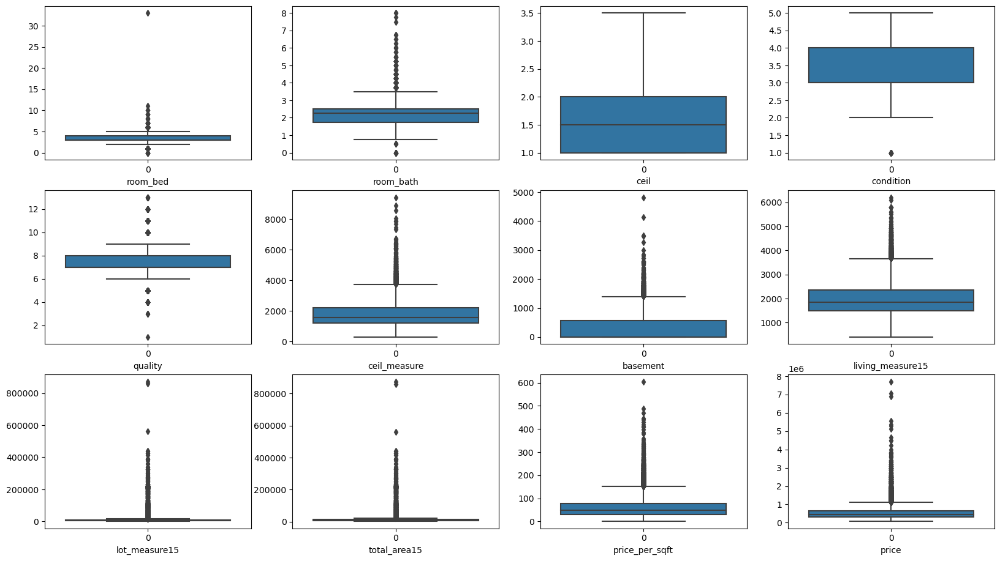

In [ ]:
# Outlier detection using boxplots
plt.figure(figsize= (20,15))

plt.subplot(4,4,1)
sns.boxplot(property_df['room_bed'])
plt.xlabel('room_bed')

plt.subplot(4,4,2)
sns.boxplot(property_df['room_bath'])
plt.xlabel('room_bath')

plt.subplot(4,4,3)
sns.boxplot(property_df['ceil'])
plt.xlabel('ceil')

plt.subplot(4,4,4)
sns.boxplot(property_df['condition'])
plt.xlabel('condition')

plt.subplot(4,4,5)
sns.boxplot(property_df['quality'])
plt.xlabel('quality')

plt.subplot(4,4,6)
sns.boxplot(property_df['ceil_measure'])
plt.xlabel('ceil_measure')

plt.subplot(4,4,7)
sns.boxplot(property_df['basement'])
plt.xlabel('basement')

plt.subplot(4,4,8)
sns.boxplot(property_df['living_measure15'])
plt.xlabel('living_measure15')

plt.subplot(4,4,9)
sns.boxplot(property_df['lot_measure15'])
plt.xlabel('lot_measure15')

plt.subplot(4,4,10)
sns.boxplot(property_df['total_area15'])
plt.xlabel('total_area15')

plt.subplot(4,4,11)
sns.boxplot(property_df['price_per_sqft'])
plt.xlabel('price_per_sqft')

plt.subplot(4,4,12)
sns.boxplot(property_df['price'])
plt.xlabel('price')

Key Takeaways:<br>
There are significant outliers in many features, especially in variables like room_bed, room_bath, ceil_measure, and lot_measure15, which may represent luxury or unique properties.<br>
These outliers could distort the predictive model if not treated properly, as they are not representative of the typical housing market.<br>
After outlier detection, it's important to decide whether to remove or adjust these extreme values to improve the model's performance.<br>
These plots highlight the need for handling outliers, as they can skew the results and affect model accuracy.<br>

In [ ]:
#Need to handle outliers for room_bed, room_bath,condition, quality, ceil_measure, basement, living_measure15,
#lot_measure15, total_area15, price_per_sqft and price
#Filling outliers
property_df['room_bed']=property_df['room_bed'].clip(lower=property_df['room_bed'].quantile(0.05), upper=property_df['room_bed'].quantile(0.95))
property_df['room_bath']=property_df['room_bath'].clip(lower=property_df['room_bath'].quantile(0.05), upper=property_df['room_bath'].quantile(0.95))
property_df['condition']=property_df['condition'].clip(lower=property_df['condition'].quantile(0.05), upper=property_df['condition'].quantile(0.95))
property_df['quality']=property_df['quality'].clip(lower=property_df['quality'].quantile(0.08), upper=property_df['quality'].quantile(0.92))
property_df['ceil_measure']=property_df['ceil_measure'].clip(lower=property_df['ceil_measure'].quantile(0.05), upper=property_df['ceil_measure'].quantile(0.95))
property_df['basement']=property_df['basement'].clip(lower=property_df['basement'].quantile(0.05), upper=property_df['basement'].quantile(0.95))
property_df['living_measure15']=property_df['living_measure15'].clip(lower=property_df['living_measure15'].quantile(0.05), upper=property_df['living_measure15'].quantile(0.95))
property_df['lot_measure15']=property_df['lot_measure15'].clip(lower=property_df['lot_measure15'].quantile(0.15), upper=property_df['lot_measure15'].quantile(0.80))
property_df['total_area15']=property_df['total_area15'].clip(lower=property_df['total_area15'].quantile(0.15), upper=property_df['total_area15'].quantile(0.80))
property_df['price_per_sqft']=property_df['price_per_sqft'].clip(lower=property_df['price_per_sqft'].quantile(0.08), upper=property_df['price_per_sqft'].quantile(0.92))
property_df['price']=property_df['price'].clip(lower=property_df['price'].quantile(0.10), upper=property_df['price'].quantile(0.90))

Text(0.5, 0, 'price')

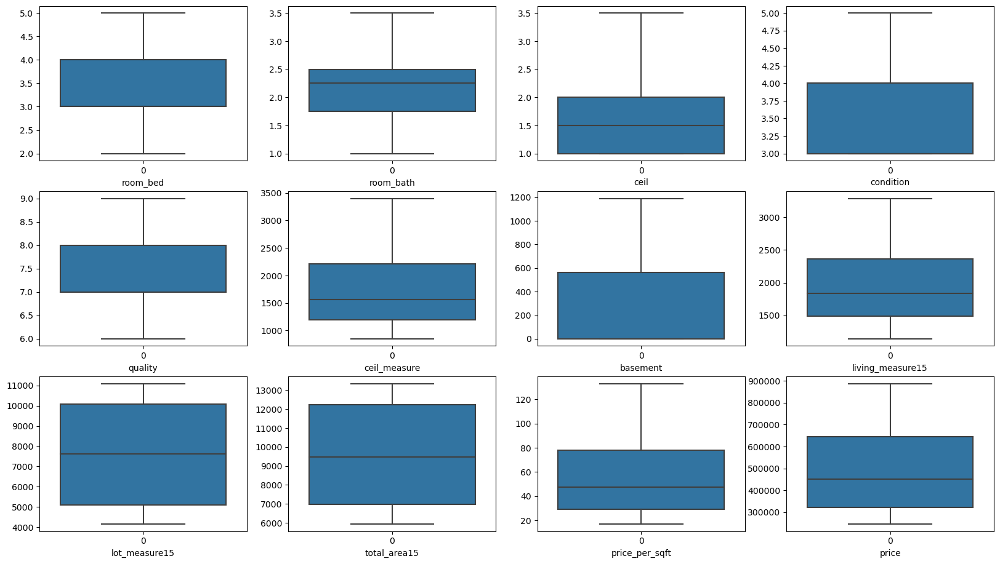

In [ ]:
# After handling outliers
plt.figure(figsize= (20,15))

plt.subplot(4,4,1)
sns.boxplot(property_df['room_bed'])
plt.xlabel('room_bed')

plt.subplot(4,4,2)
sns.boxplot(property_df['room_bath'])
plt.xlabel('room_bath')

plt.subplot(4,4,3)
sns.boxplot(property_df['ceil'])
plt.xlabel('ceil')

plt.subplot(4,4,4)
sns.boxplot(property_df['condition'])
plt.xlabel('condition')

plt.subplot(4,4,5)
sns.boxplot(property_df['quality'])
plt.xlabel('quality')

plt.subplot(4,4,6)
sns.boxplot(property_df['ceil_measure'])
plt.xlabel('ceil_measure')

plt.subplot(4,4,7)
sns.boxplot(property_df['basement'])
plt.xlabel('basement')

plt.subplot(4,4,8)
sns.boxplot(property_df['living_measure15'])
plt.xlabel('living_measure15')

plt.subplot(4,4,9)
sns.boxplot(property_df['lot_measure15'])
plt.xlabel('lot_measure15')

plt.subplot(4,4,10)
sns.boxplot(property_df['total_area15'])
plt.xlabel('total_area15')

plt.subplot(4,4,11)
sns.boxplot(property_df['price_per_sqft'])
plt.xlabel('price_per_sqft')

plt.subplot(4,4,12)
sns.boxplot(property_df['price'])
plt.xlabel('price')

In [ ]:
property_df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,21607.0,498575.916647,207764.401459,245000.00,321725.00,450000.00,645000.00,887080.0000
room_bed,21607.0,3.358634,0.825795,2.00,3.00,3.00,4.00,5.0000
room_bath,21607.0,2.097434,0.711920,1.00,1.75,2.25,2.50,3.5000
ceil,21607.0,1.493960,0.538934,1.00,1.00,1.50,2.00,3.5000
coast,21607.0,0.007451,0.086001,0.00,0.00,0.00,0.00,1.0000
condition,21607.0,3.418475,0.632593,3.00,3.00,3.00,4.00,5.0000
quality,21607.0,7.566807,0.923515,6.00,7.00,7.00,8.00,9.0000
ceil_measure,21607.0,1761.835516,726.604141,850.00,1190.00,1560.00,2210.00,3400.0000
basement,21607.0,276.672514,398.863980,0.00,0.00,0.00,560.00,1190.0000
living_measure15,21607.0,1966.981487,605.547006,1140.00,1490.00,1840.00,2360.00,3290.0000


## Exploratory Data Analysis

## Univariate Analysis

In [ ]:
#Let's examine the target column which is price
property_df.describe(include="all")["price"]

count      21607.000000
unique              NaN
top                 NaN
freq                NaN
mean      498575.916647
std       207764.401459
min       245000.000000
25%       321725.000000
50%       450000.000000
75%       645000.000000
max       887080.000000
Name: price, dtype: float64

In [ ]:
#Let's look at the distribution of price at different percentiles
print("0.5% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 0.5)))
print("  1% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 1)))
print("  5% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 5)))
print(" 10% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 10)))
print(" 90% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 90)))
print(" 95% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 95)))
print(" 99% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 99)))
print("99.5% properties have a price lower than {0: .2f}".format(np.percentile(property_df["price"], 99.5)))

0.5% properties have a price lower than  245000.00
  1% properties have a price lower than  245000.00
  5% properties have a price lower than  245000.00
 10% properties have a price lower than  245000.00
 90% properties have a price lower than  887032.00
 95% properties have a price lower than  887080.00
 99% properties have a price lower than  887080.00
99.5% properties have a price lower than  887080.00


Text(0.5, 1.0, 'Price Distribution')

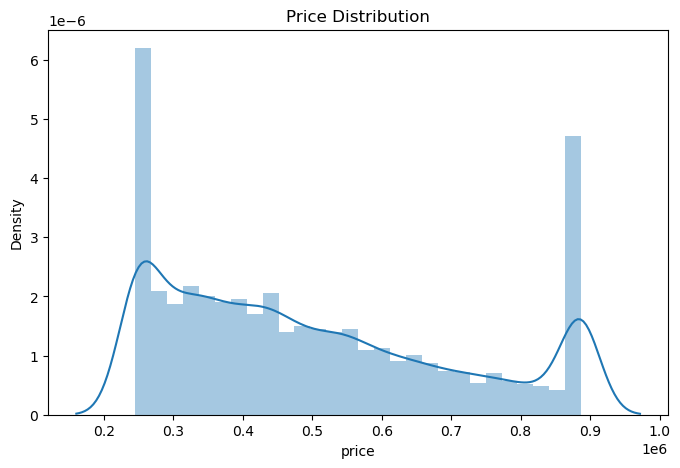

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(property_df['price'])
plt.title('Price Distribution')

The price distribution is bimodal with peaks around 250k and 900k, indicating two market segments. The right skew suggests most homes are lower-priced, with potential outliers in higher price ranges.

Text(0, 0.5, 'Count')

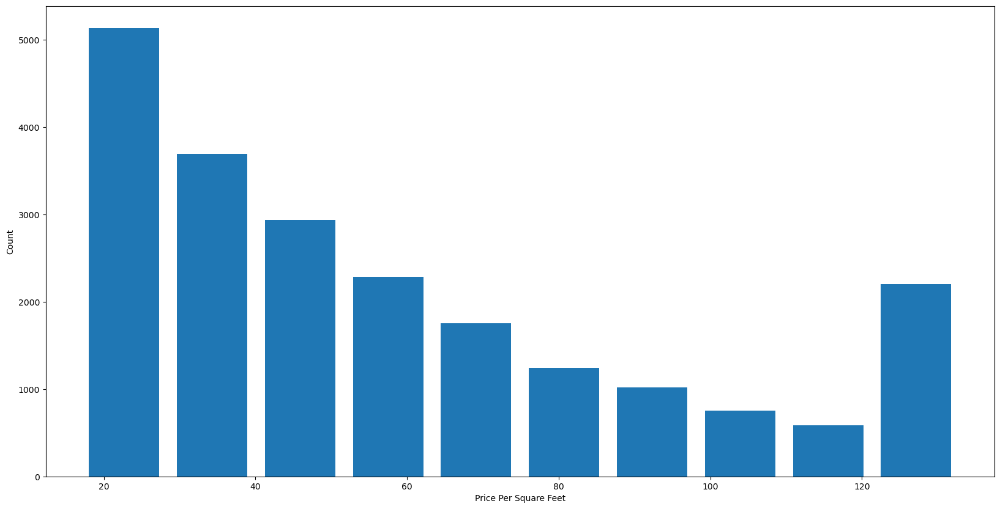

In [ ]:
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(property_df.price_per_sqft,rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

The graph shows a decreasing trend in the count of properties as price per square foot increases, with a spike at the highest range. This suggests fewer luxury properties but significant demand at lower prices.

count    21607.000000
mean         3.358634
std          0.825795
min          2.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: room_bed, dtype: float64


[Text(0, 0, '2956'),
 Text(0, 0, '9872'),
 Text(0, 0, '6853'),
 Text(0, 0, '1926')]

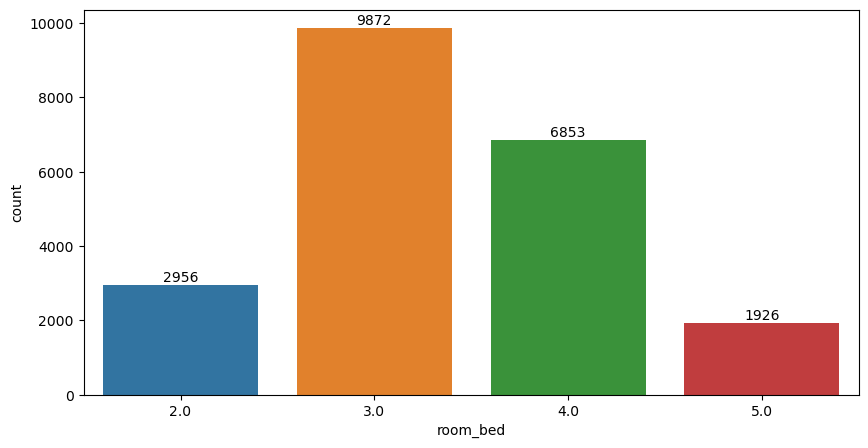

In [ ]:
#Lets analyze bedroom feature
print(property_df.room_bed.describe())
plt.figure(figsize=(10, 5))
ax=sns.countplot(x="room_bed",data=property_df)
ax.bar_label(ax.containers[0])

Most properties have 3 or 4 bedrooms, with 3-bedroom homes being the most common. Demand decreases for 2-bedroom and 5-bedroom properties, indicating a preference for mid-sized homes.

In [ ]:
property_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21607 entries, 0 to 21612
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21607 non-null  int64  
 1   room_bed          21607 non-null  float64
 2   room_bath         21607 non-null  float64
 3   ceil              21607 non-null  float64
 4   coast             21607 non-null  float64
 5   condition         21607 non-null  float64
 6   quality           21607 non-null  float64
 7   ceil_measure      21607 non-null  float64
 8   basement          21607 non-null  float64
 9   living_measure15  21607 non-null  float64
 10  lot_measure15     21607 non-null  float64
 11  furnished         21607 non-null  float64
 12  Property_Age      21607 non-null  object 
 13  Renovated         21607 non-null  int32  
 14  total_area15      21607 non-null  float64
 15  price_per_sqft    21607 non-null  float64
dtypes: float64(13), int32(1), int64(1), obje

In [ ]:
property_df.head()

,price,room_bed,room_bath,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,Property_Age,Renovated,total_area15,price_per_sqft
0,600000,4.0,1.75,1.0,0.0,3.0,8.0,1800.0,1190.0,2020.0,8660.0,0.0,HighAge_Property,0,10680.0,56.1800
1,245000,2.0,1.00,1.0,0.0,4.0,6.0,850.0,0.0,1660.0,4143.9,0.0,Vintage_Property,0,5930.0,32.9900
2,735000,4.0,2.75,2.0,1.0,3.0,8.0,3040.0,0.0,2620.0,4143.9,0.0,HighAge_Property,0,5930.0,132.9404
3,257000,3.0,2.50,2.0,0.0,3.0,8.0,1740.0,0.0,2030.0,4143.9,0.0,New_Property,0,5930.0,44.1300
4,450000,2.0,1.00,1.0,0.0,3.0,7.0,1120.0,0.0,1140.0,5100.0,0.0,Vintage_Property,0,6220.0,72.3500


count    21607.000000
mean         2.097434
std          0.711920
min          1.000000
25%          1.750000
50%          2.250000
75%          2.500000
max          3.500000
Name: room_bath, dtype: float64
None


[Text(0, 0, '3915'),
 Text(0, 0, '6394'),
 Text(0, 0, '9429'),
 Text(0, 0, '1869')]

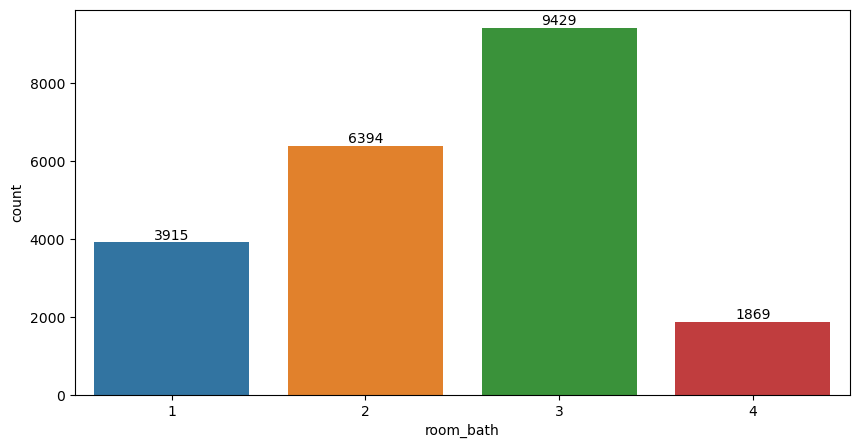

In [ ]:
#Lets analyze bathroom feature
print(print(property_df.room_bath.describe()))

#Number of bathroms cannot be in halves so we will round off the values
property_df['room_bath']=np.ceil(property_df['room_bath']).astype(int)
plt.figure(figsize=(10, 5))
ax=sns.countplot(x="room_bath",data=property_df)
ax.bar_label(ax.containers[0])

The graph shows that most properties have 3 bathrooms (highest count: 9429), followed by 2 bathrooms (6394). Properties with 4 bathrooms or 1 bathroom are less common.

In [ ]:
#Lets analyze ceil feature
print(property_df['ceil'].value_counts())

1.0    10647
2.0     8205
1.5     1977
3.0      609
2.5      161
3.5        8
Name: ceil, dtype: int64


Number of ceil cannot be in halves. We need to round off the values

count    21607.000000
mean         1.543620
std          0.567104
min          1.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: ceil, dtype: float64


[Text(0, 0, '10647'), Text(0, 0, '10182'), Text(0, 0, '770'), Text(0, 0, '8')]

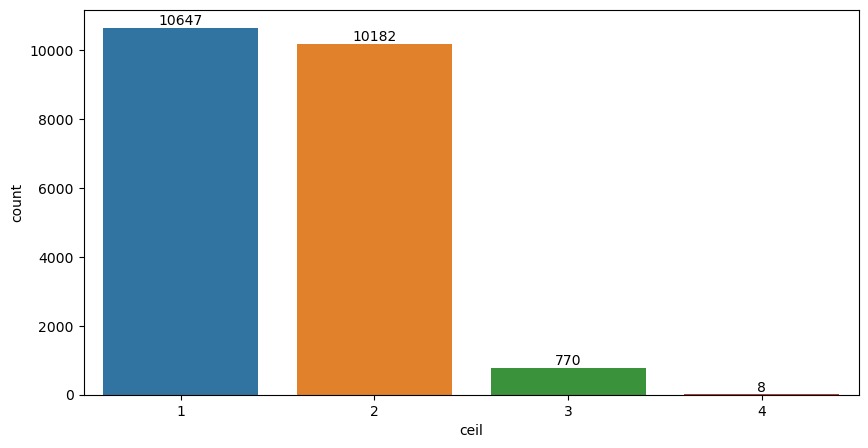

In [ ]:
property_df['ceil']=np.ceil(property_df['ceil']).astype(int)
print(property_df.ceil.describe())
plt.figure(figsize=(10, 5))
ax=sns.countplot(x="ceil",data=property_df)
ax.bar_label(ax.containers[0])

Most properties have 1 or 2 floors (ceilings), with counts of 10,647 and 10,182, respectively. Properties with 3 or 4 floors are very rare, making up a minor portion.

count    21607.000000
mean         0.007451
std          0.086001
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: coast, dtype: float64


[Text(0, 0, '21446'), Text(0, 0, '161')]

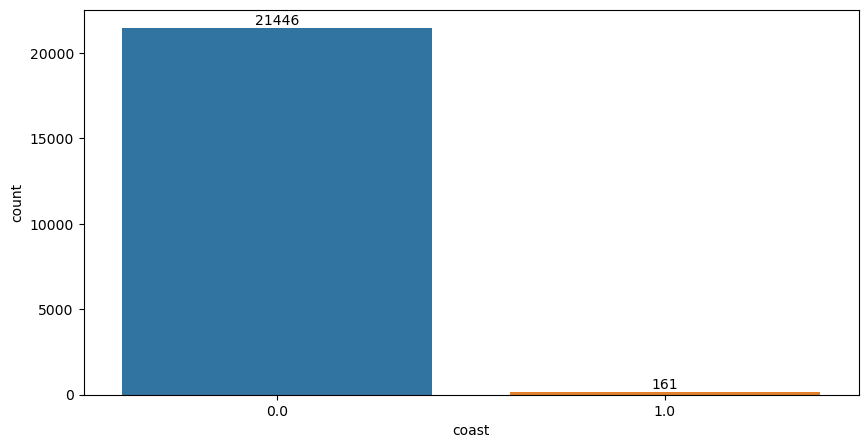

In [ ]:
#Lets analyze coast feature
print(property_df.coast.describe())
plt.figure(figsize=(10, 5))
plt.xticks([0.0,1.0],['No','Yes'])
ax=sns.countplot(x="coast",data=property_df)
ax.bar_label(ax.containers[0])

Most of the properties in our dataset are non coastal properties

count    21607.000000
mean         3.418475
std          0.632593
min          3.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: condition, dtype: float64


[Text(0, 0, '14259'), Text(0, 0, '5654'), Text(0, 0, '1694')]

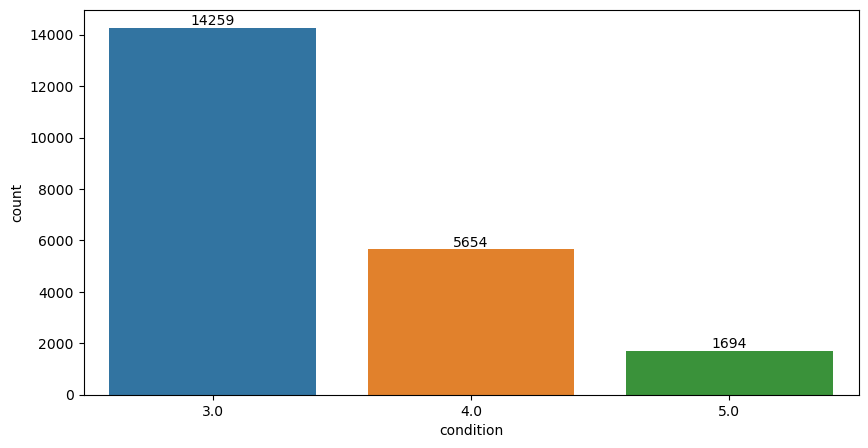

In [ ]:
#Lets analyze condition feature
print(property_df.condition.describe())
plt.figure(figsize=(10, 5))
ax=sns.countplot(x="condition",data=property_df)
ax.bar_label(ax.containers[0])

Most of the properties in our dataset are of average condition

count    21607.000000
mean         7.566807
std          0.923515
min          6.000000
25%          7.000000
50%          7.000000
75%          8.000000
max          9.000000
Name: quality, dtype: float64


[Text(0, 0, '2313'),
 Text(0, 0, '8982'),
 Text(0, 0, '6064'),
 Text(0, 0, '4248')]

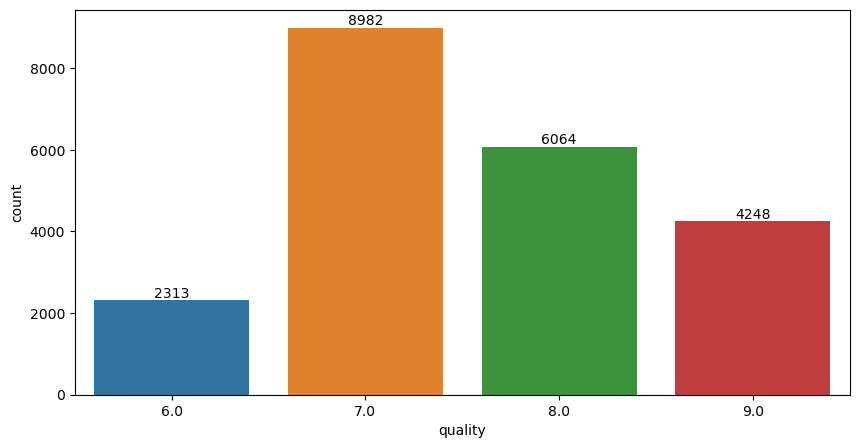

In [ ]:
#Lets analyze quality feature
print(property_df.quality.describe())
plt.figure(figsize=(10, 5))
ax=sns.countplot(x="quality",data=property_df)
ax.bar_label(ax.containers[0])

Most of our properties in dataset have very good quality grading

Text(0.5, 1.0, 'Ceil Measure Distribution')

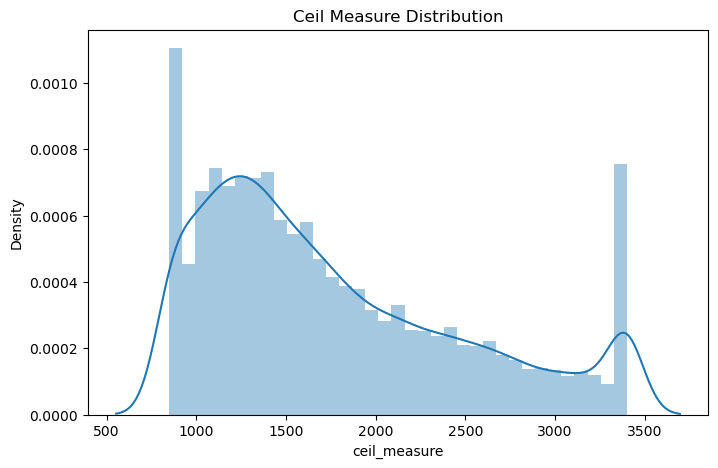

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(property_df['ceil_measure'])
plt.title('Ceil Measure Distribution')

Text(0.5, 1.0, 'Basement Distribution')

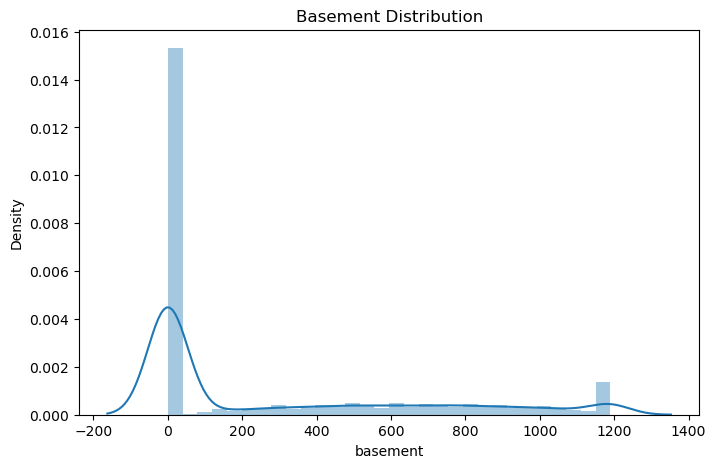

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(property_df['basement'])
plt.title('Basement Distribution')

Text(0.5, 1.0, 'Living Measure Distribution')

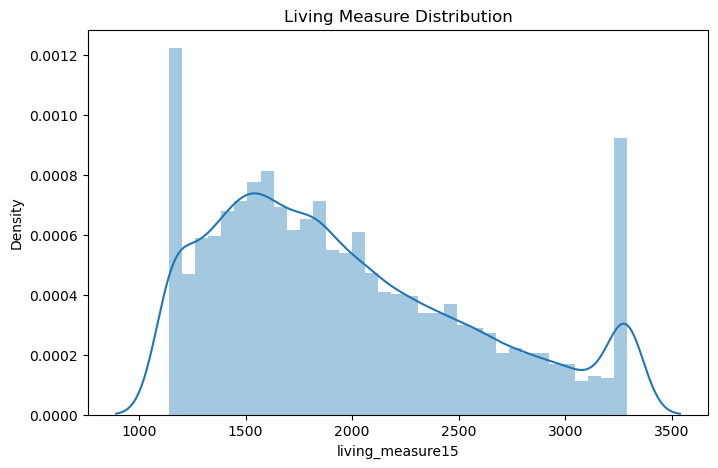

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(property_df['living_measure15'])
plt.title('Living Measure Distribution')

Text(0.5, 1.0, 'Lot Measure Distribution')

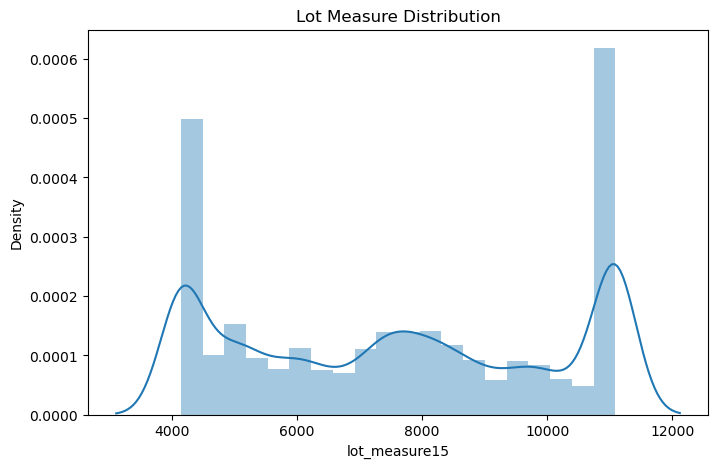

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(property_df['lot_measure15'])
plt.title('Lot Measure Distribution')

count    21607.000000
mean         0.196372
std          0.397262
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: furnished, dtype: float64


[Text(0, 0, '17364'), Text(0, 0, '4243')]

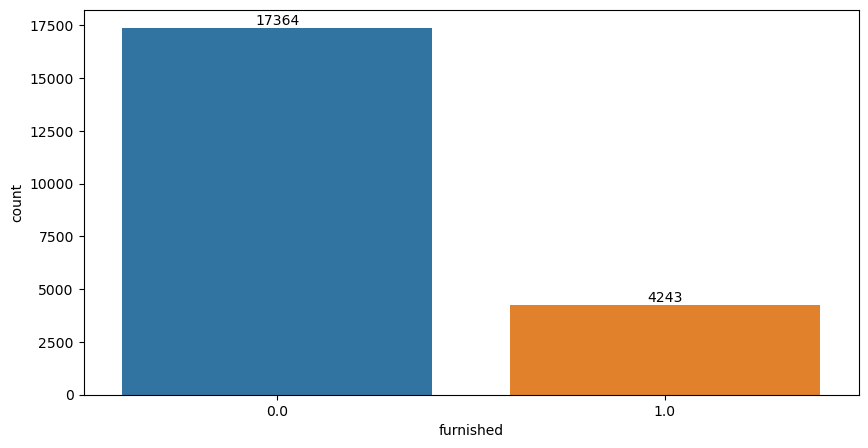

In [ ]:
#Lets analyze furnished feature
print(property_df.furnished.describe())
plt.figure(figsize=(10, 5))
plt.xticks([0,1],['No','Yes'])
ax=sns.countplot(x="furnished",data=property_df)
ax.bar_label(ax.containers[0])

Most of the properties are non furnished

count                21607
unique                   4
top       Vintage_Property
freq                  8592
Name: Property_Age, dtype: object


[Text(0, 0, '4731'),
 Text(0, 0, '8592'),
 Text(0, 0, '3154'),
 Text(0, 0, '5130')]

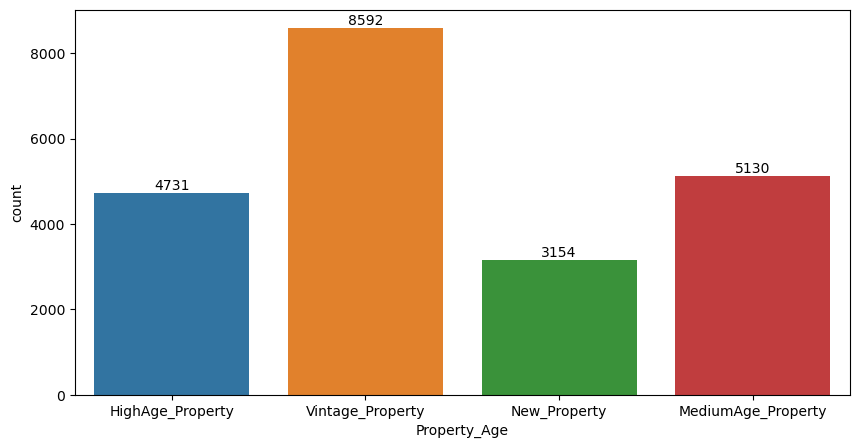

In [ ]:
#Lets analyze Property_Age feature
print(property_df.Property_Age.describe())
plt.figure(figsize=(10, 5))
ax=sns.countplot(x="Property_Age",data=property_df)
ax.bar_label(ax.containers[0])

Most of the properties in our dataset are vintage properties i.e., above 50 years aged properties

count    21607.000000
mean         0.042255
std          0.201175
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: Renovated, dtype: float64


[Text(0, 0, '20694'), Text(0, 0, '913')]

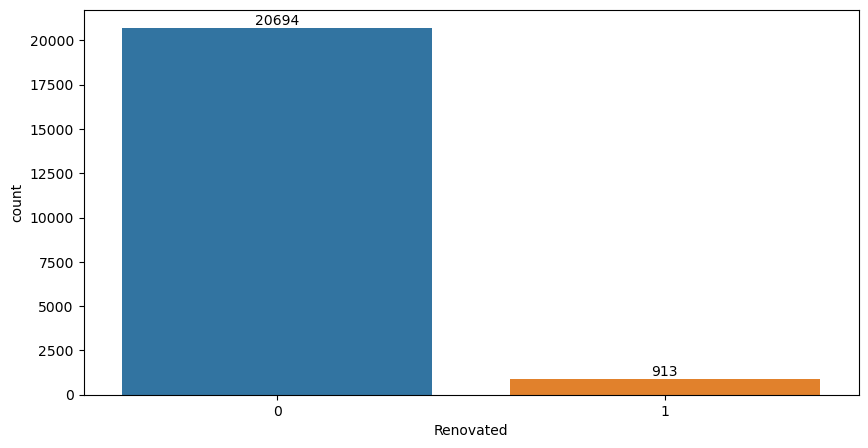

In [ ]:
#Lets analyze Renovated feature
print(property_df.Renovated.describe())
plt.figure(figsize=(10, 5))
plt.xticks([0,1],['No','Yes'])
ax=sns.countplot(x="Renovated",data=property_df)
ax.bar_label(ax.containers[0])

Most of the properties are not Renovated

Text(0.5, 1.0, 'Total Area Distribution')

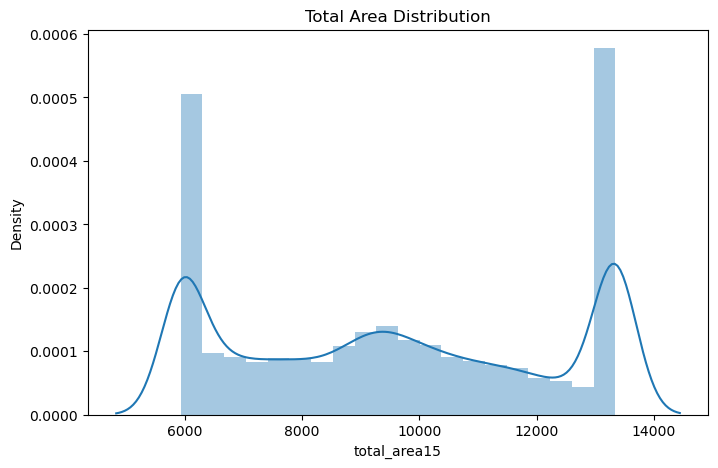

In [ ]:
plt.figure(figsize=(8,5))
sns.distplot(property_df['total_area15'])
plt.title('Total Area Distribution')

## Bivariate Analysis

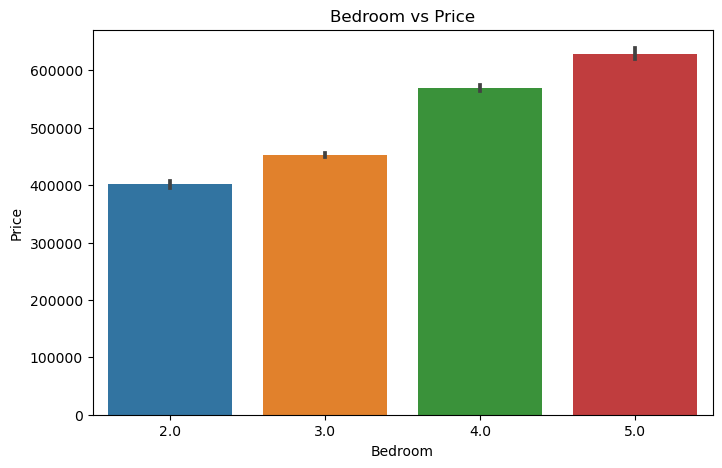

In [ ]:
#Lets analyze room_bed feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='room_bed', y='price', data=property_df)
plt.title('Bedroom vs Price')
plt.xlabel('Bedroom')
plt.ylabel('Price')
plt.show()

Price increases as the number of bedrooms increases. The graph shows a clear upward trend, with homes having 5 bedrooms being significantly more expensive than those with 2, 3, or 4 bedrooms.
Interpretation: The number of bedrooms has a strong positive correlation with property price. This is intuitive as larger homes (with more bedrooms) generally cost more due to greater space and amenities.

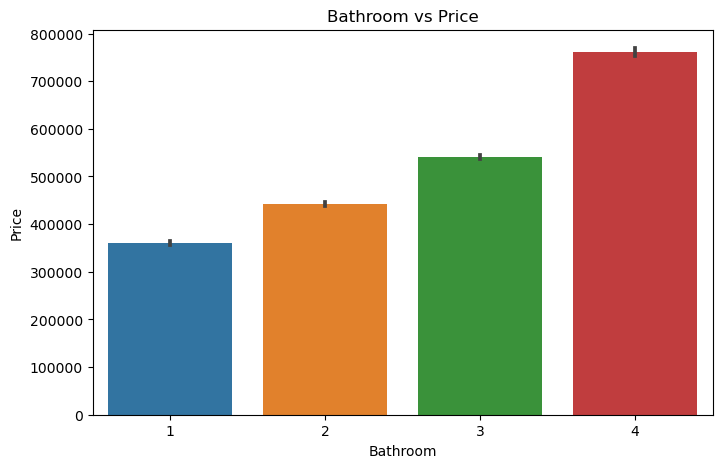

In [ ]:
#Lets analyze room_bath feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='room_bath', y='price', data=property_df)
plt.title('Bathroom vs Price')
plt.xlabel('Bathroom')
plt.ylabel('Price')
plt.show()

There is a clear trend in which properties with more bathrooms tend to have higher prices. As the number of bathrooms increases from 1 to 4, the average property price rises significantly. The number of bathrooms is a strong determinant of a property’s value.

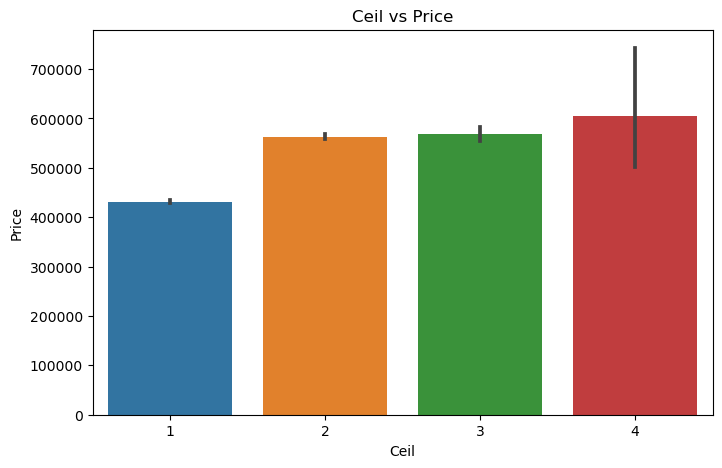

In [ ]:
#Lets analyze ceil feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='ceil', y='price', data=property_df)
plt.title('Ceil vs Price')
plt.xlabel('Ceil')
plt.ylabel('Price')
plt.show()

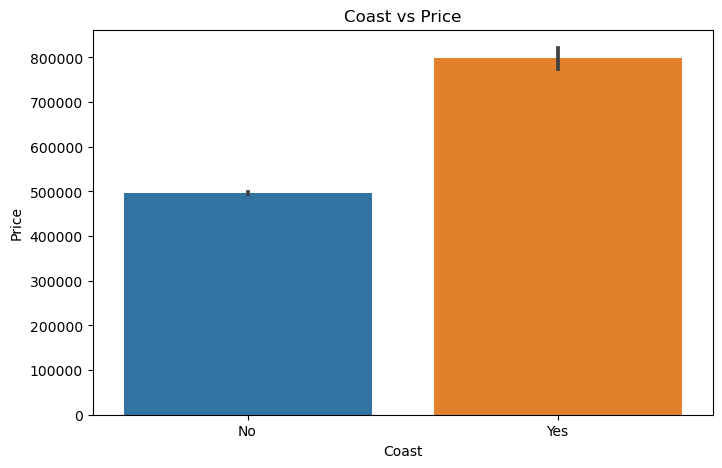

In [ ]:
#Lets analyze coast feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='coast', y='price', data=property_df)
plt.xticks([0,1],['No','Yes'])
plt.title('Coast vs Price')
plt.xlabel('Coast')
plt.ylabel('Price')
plt.show()
#water-front and non_water front

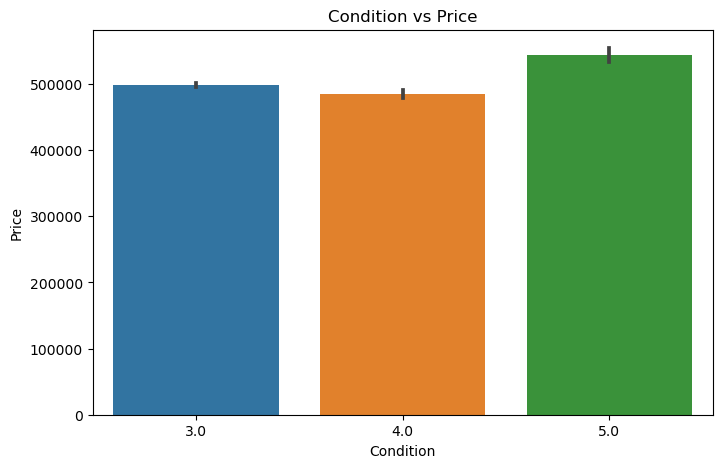

In [ ]:
#Lets analyze condition feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='condition', y='price', data=property_df)
plt.title('Condition vs Price')
plt.xlabel('Condition')
plt.ylabel('Price')
plt.show()

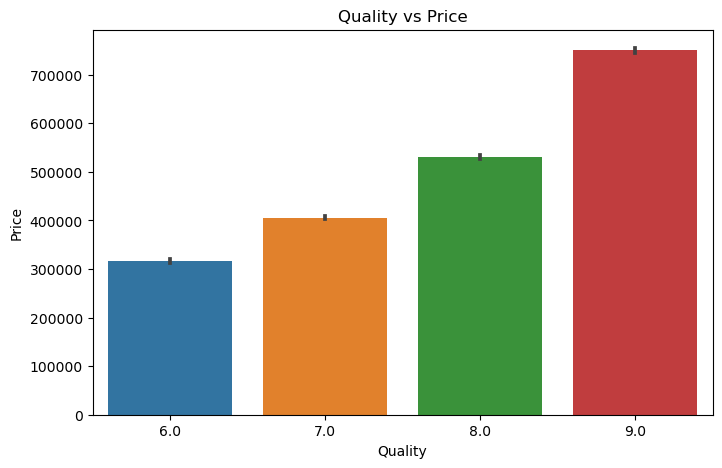

In [ ]:
#Lets analyze quality feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='quality', y='price', data=property_df)
plt.title('Quality vs Price')
plt.xlabel('Quality')
plt.ylabel('Price')
plt.show()

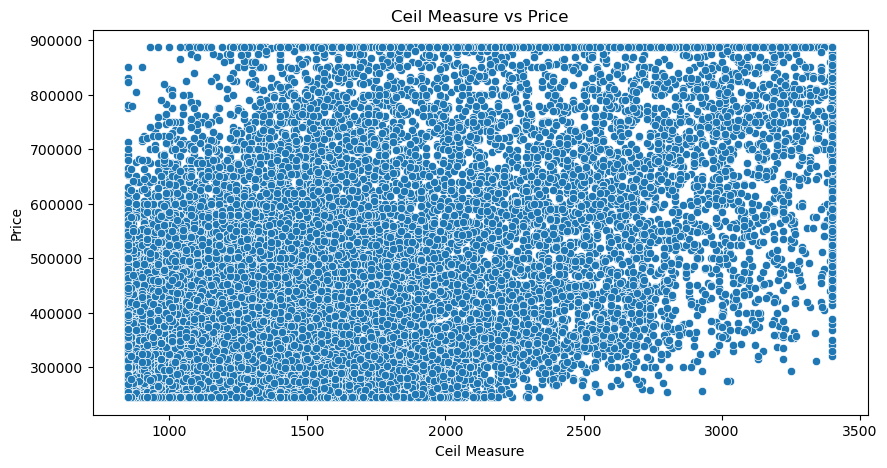

In [ ]:
#Lets analyze ceil_measure feature with our target feature price
plt.figure(figsize=(10,5))
sns.scatterplot(x='ceil_measure', y='price', data=property_df)
plt.title('Ceil Measure vs Price')
plt.xlabel('Ceil Measure')
plt.ylabel('Price')
plt.show()

count    21607.000000
mean      1761.835516
std        726.604141
min        850.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       3400.000000
Name: ceil_measure, dtype: float64

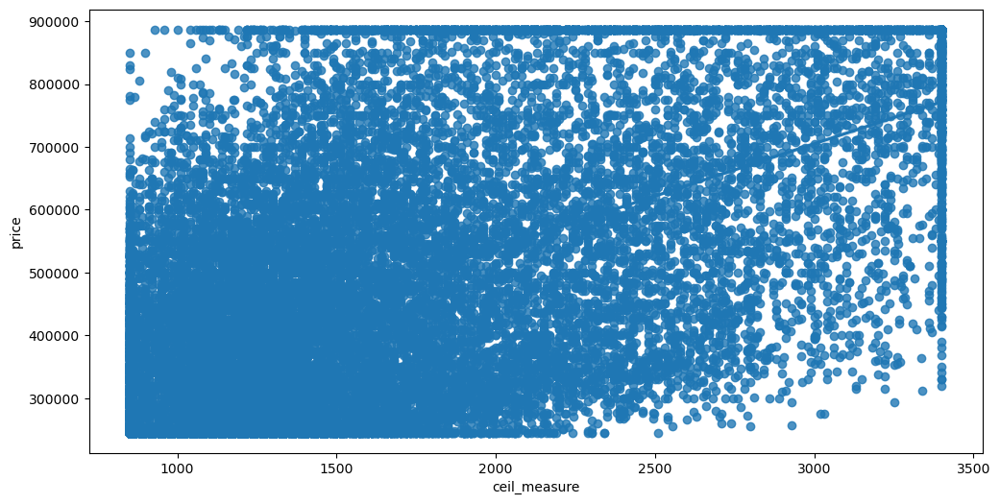

In [ ]:
#ceil_measure - price increases with increase in ceil measure
plt.figure(figsize=(12, 6))
sns.regplot(data=property_df, x="ceil_measure", y="price")
property_df['ceil_measure'].describe()

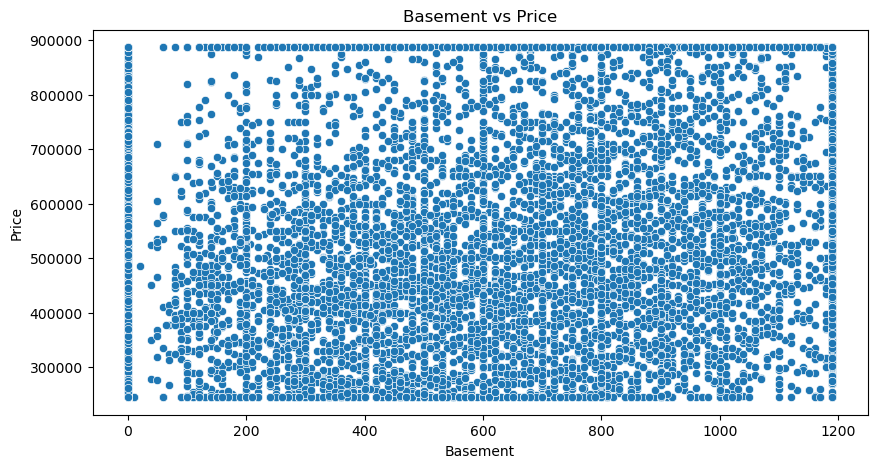

In [ ]:
#Lets analyze basement feature with our target feature price
plt.figure(figsize=(10,5))
sns.scatterplot(x='basement', y='price', data=property_df)
plt.title('Basement vs Price')
plt.xlabel('Basement')
plt.ylabel('Price')
plt.show()

count    21607.000000
mean       276.672514
std        398.863980
min          0.000000
25%          0.000000
50%          0.000000
75%        560.000000
max       1190.000000
Name: basement, dtype: float64

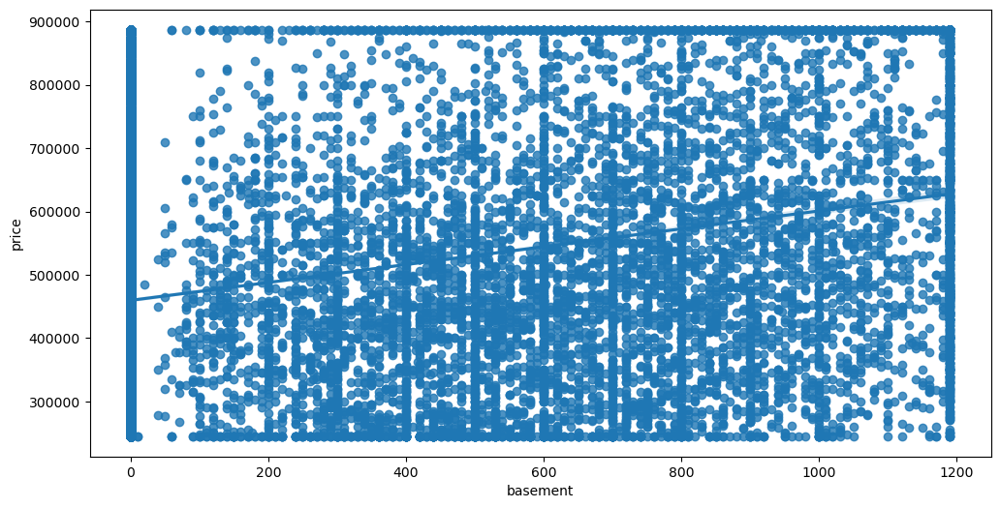

In [ ]:
#basement - price increases with increase in ceil measure
plt.figure(figsize=(12, 6))
sns.regplot(data=property_df, x="basement", y="price")
property_df['basement'].describe()

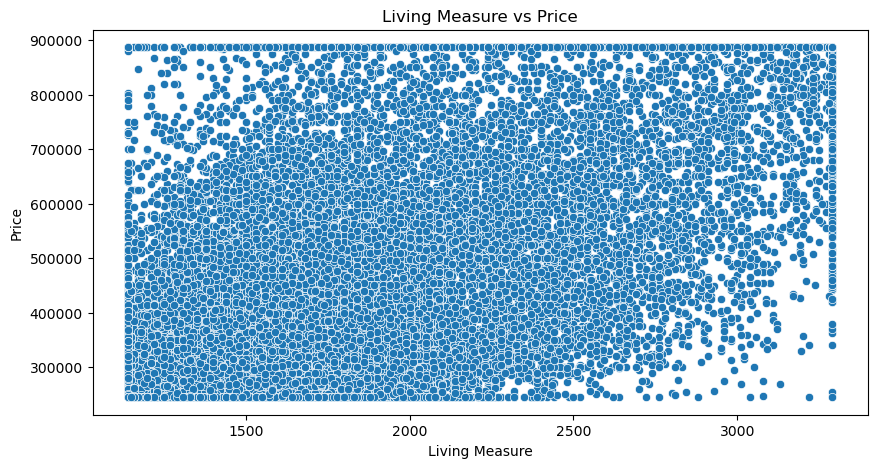

In [ ]:
#Lets analyze living measure feature with our target feature price
plt.figure(figsize=(10,5))
sns.scatterplot(x='living_measure15', y='price', data=property_df)
plt.title('Living Measure vs Price')
plt.xlabel('Living Measure')
plt.ylabel('Price')
plt.show()

count    21607.000000
mean      1966.981487
std        605.547006
min       1140.000000
25%       1490.000000
50%       1840.000000
75%       2360.000000
max       3290.000000
Name: living_measure15, dtype: float64

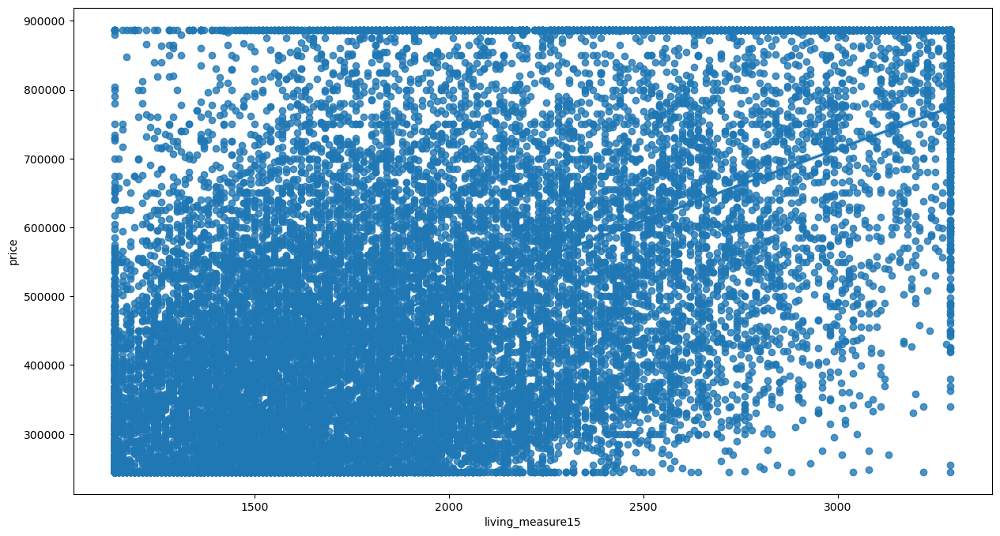

In [ ]:
#living_measure - price increases with increase in living measure
plt.figure(figsize=(15,8))
#print(sns.scatterplot(df_cleaned['living_measure'],df_cleaned['price']))

sns.regplot(data=property_df, x="living_measure15", y="price")
property_df['living_measure15'].describe()

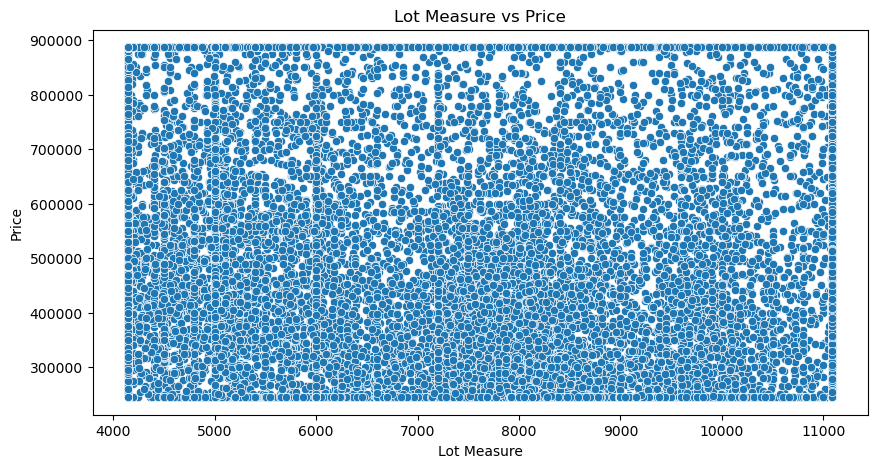

In [ ]:
#Lets analyze Lot Measure feature with our target feature price
plt.figure(figsize=(10,5))
sns.scatterplot(x='lot_measure15', y='price', data=property_df)
plt.title('Lot Measure vs Price')
plt.xlabel('Lot Measure')
plt.ylabel('Price')
plt.show()

<Axes: xlabel='lot_measure15', ylabel='price'>

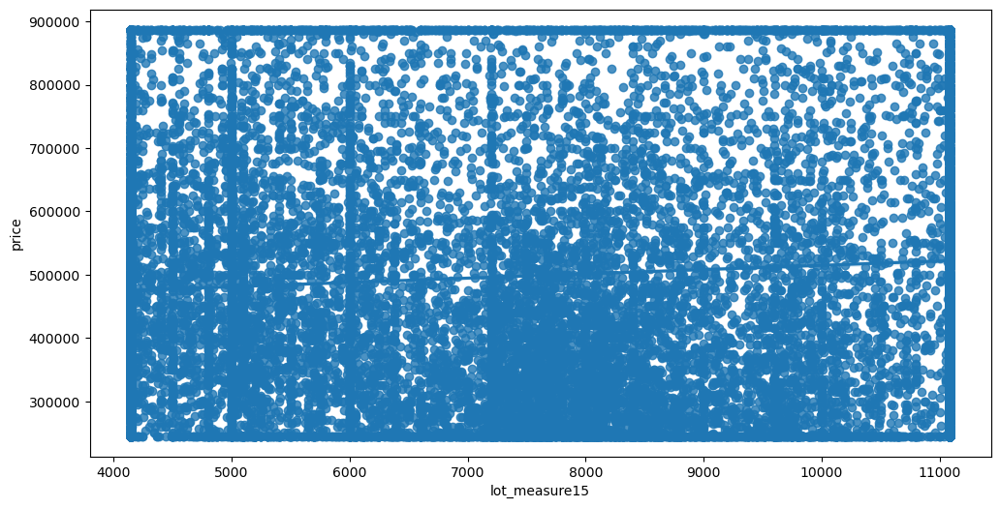

In [ ]:
#lot_measure - there seems to be no relation between lot_measure and price
#lot_measure - data value range is very large so breaking it get better view.
plt.figure(figsize=(12,6))
sns.regplot(data=property_df, x="lot_measure15", y="price")
#property_df['lot_measure'].describe()

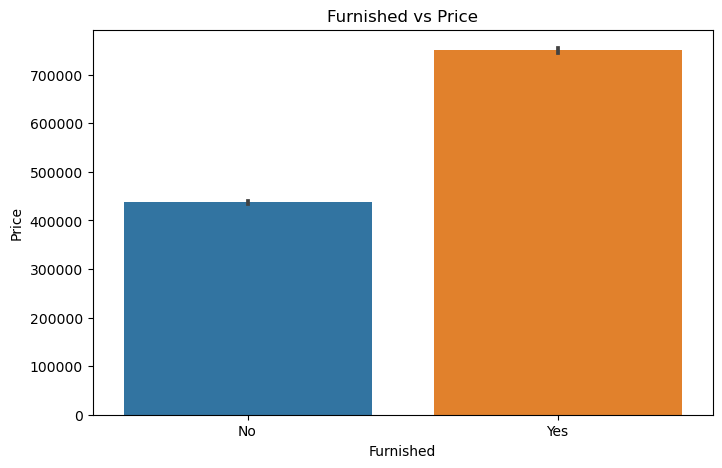

In [ ]:
#Lets analyze Furnished feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='furnished', y='price', data=property_df)
plt.xticks([0,1],['No','Yes'])
plt.title('Furnished vs Price')
plt.xlabel('Furnished')
plt.ylabel('Price')
plt.show()

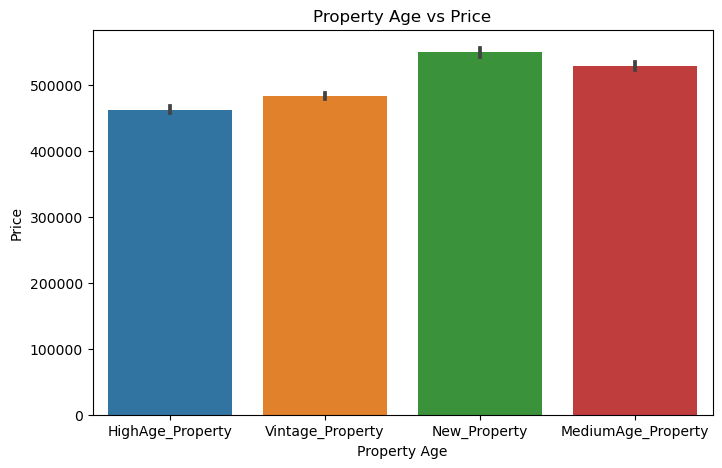

In [ ]:
#Lets analyze Property_Age feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='Property_Age', y='price', data=property_df)
plt.title('Property Age vs Price')
plt.xlabel('Property Age')
plt.ylabel('Price')
plt.show()

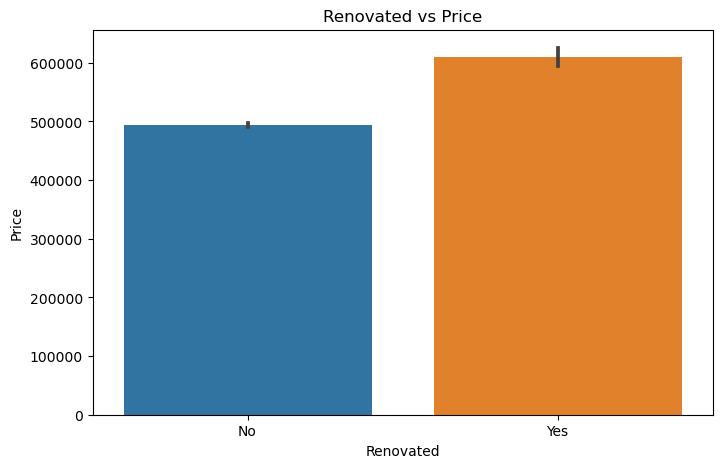

In [ ]:
#Lets analyze Renovated feature with our target feature price
plt.figure(figsize=(8,5))
sns.barplot(x='Renovated', y='price', data=property_df)
plt.xticks([0,1],['No','Yes'])
plt.title('Renovated vs Price')
plt.xlabel('Renovated')
plt.ylabel('Price')
plt.show()

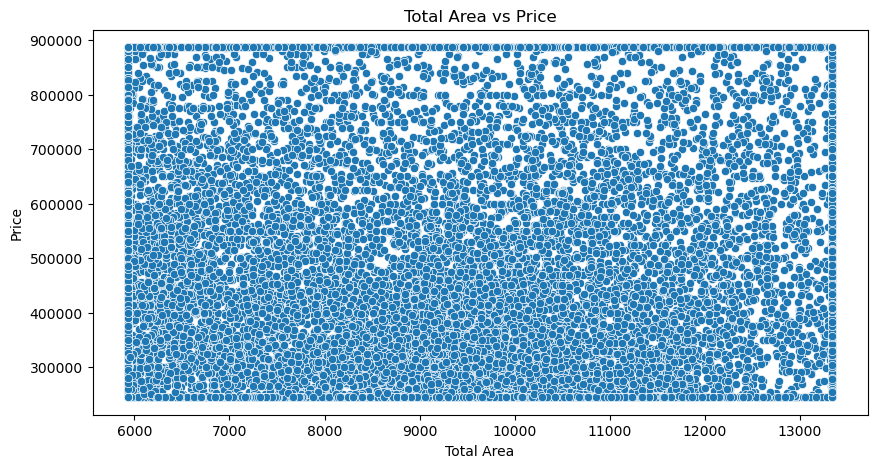

In [ ]:
#Lets analyze total_area feature with our target feature price
plt.figure(figsize=(10,5))
sns.scatterplot(x='total_area15', y='price', data=property_df)
plt.title('Total Area vs Price')
plt.xlabel('Total Area')
plt.ylabel('Price')
plt.show()

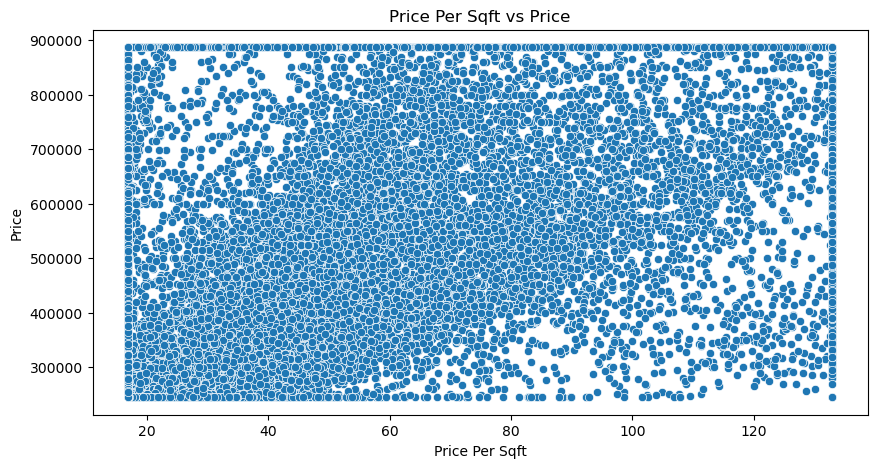

In [ ]:
#Lets analyze price per sqft feature with our target feature price
plt.figure(figsize=(10,5))
sns.scatterplot(x='price_per_sqft', y='price', data=property_df)
plt.title('Price Per Sqft vs Price')
plt.xlabel('Price Per Sqft')
plt.ylabel('Price')
plt.show()

## Multivariate Analysis

<Axes: >

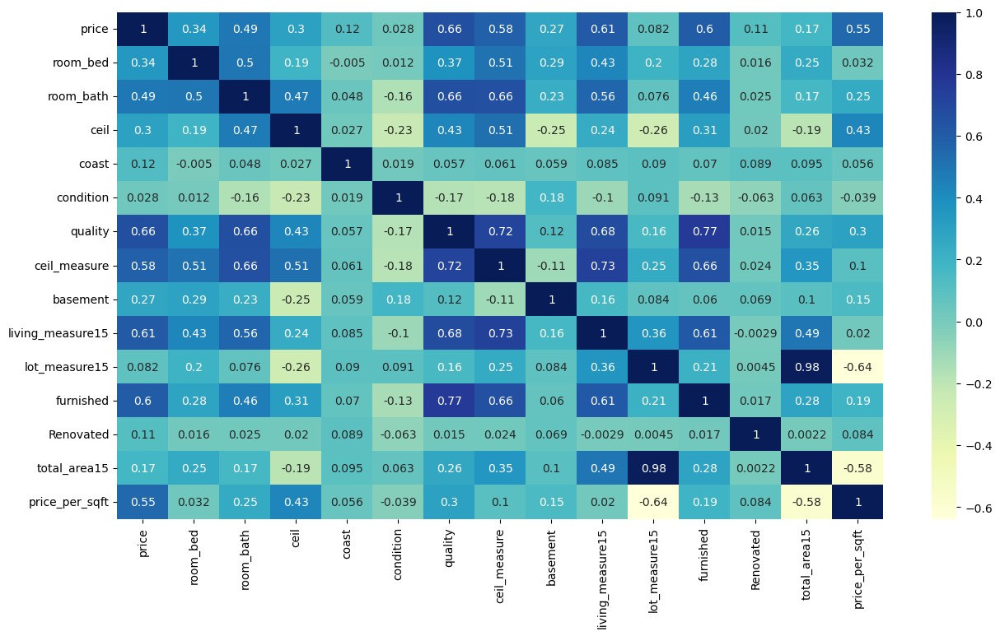

In [ ]:
#features correlation heatmap
plt.figure(figsize=(15,8))
sns.heatmap(property_df.corr(), annot=True, cmap="YlGnBu")

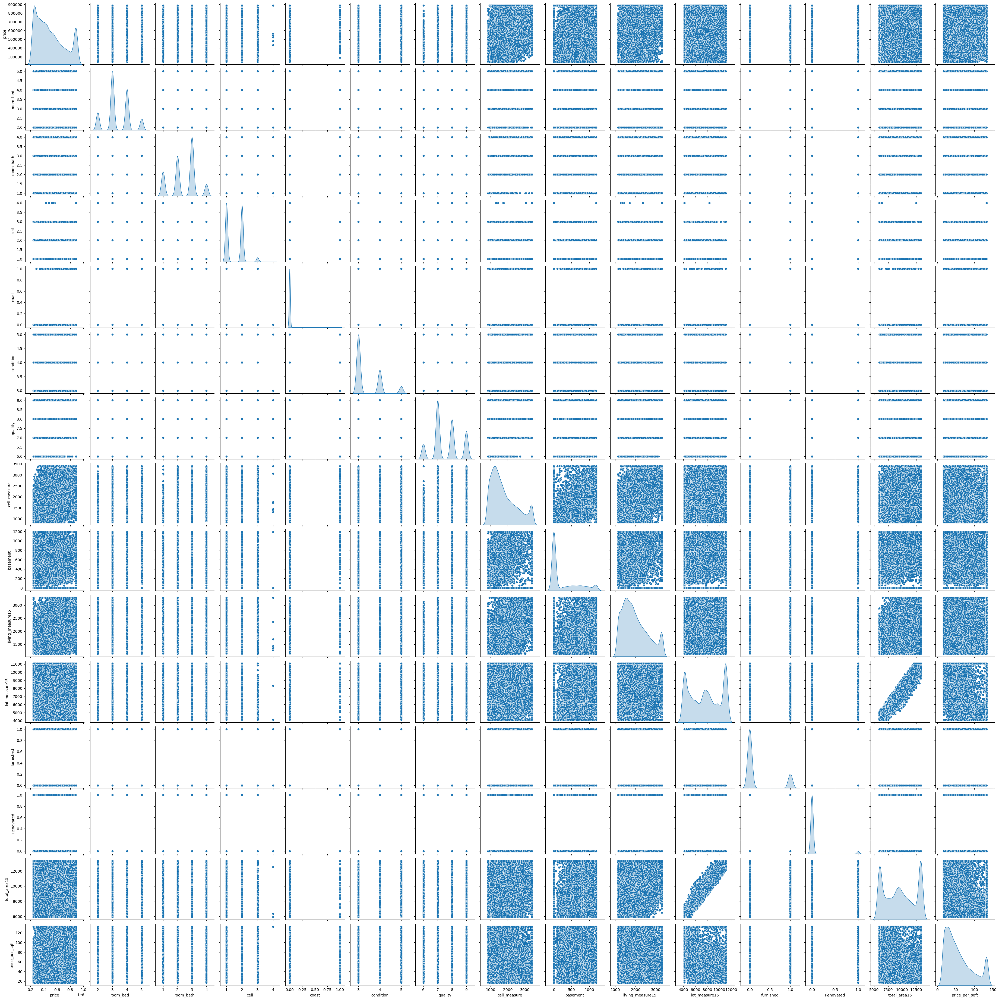

In [ ]:
# let's plot pairplot
sns.pairplot(property_df, diag_kind = 'kde')

## Model Building

In [ ]:
# Encode Property_Age feature
property_df=pd.get_dummies(property_df,drop_first=True)

In [ ]:
property_df.head()

,price,room_bed,room_bath,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,Renovated,total_area15,price_per_sqft,Property_Age_MediumAge_Property,Property_Age_New_Property,Property_Age_Vintage_Property
0,600000,4.0,2,1,0.0,3.0,8.0,1800.0,1190.0,2020.0,8660.0,0.0,0,10680.0,56.1800,0,0,0
1,245000,2.0,1,1,0.0,4.0,6.0,850.0,0.0,1660.0,4143.9,0.0,0,5930.0,32.9900,0,0,1
2,735000,4.0,3,2,1.0,3.0,8.0,3040.0,0.0,2620.0,4143.9,0.0,0,5930.0,132.9404,0,0,0
3,257000,3.0,3,2,0.0,3.0,8.0,1740.0,0.0,2030.0,4143.9,0.0,0,5930.0,44.1300,0,1,0
4,450000,2.0,1,1,0.0,3.0,7.0,1120.0,0.0,1140.0,5100.0,0.0,0,6220.0,72.3500,0,0,1


In [ ]:
#Scale the data
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
scaled_propertydf=scaler.fit_transform(property_df)
scaled_propertydf=pd.DataFrame(scaled_propertydf, columns=property_df.columns)
scaled_propertydf=scaled_propertydf.round(2)
scaled_propertydf

,price,room_bed,room_bath,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,Renovated,total_area15,price_per_sqft,Property_Age_MediumAge_Property,Property_Age_New_Property,Property_Age_Vintage_Property
0,0.49,0.78,-0.48,-0.96,-0.09,-0.66,0.47,0.05,2.29,0.09,0.41,-0.49,-0.21,0.41,-0.05,-0.56,-0.41,-0.81
1,-1.22,-1.65,-1.62,-0.96,-0.09,0.92,-1.70,-1.25,-0.69,-0.51,-1.37,-0.49,-0.21,-1.36,-0.70,-0.56,-0.41,1.23
2,1.14,0.78,0.65,0.80,11.54,-0.66,0.47,1.76,-0.69,1.08,-1.37,-0.49,-0.21,-1.36,2.12,-0.56,-0.41,-0.81
3,-1.16,-0.43,0.65,0.80,-0.09,-0.66,0.47,-0.03,-0.69,0.10,-1.37,-0.49,-0.21,-1.36,-0.38,-0.56,2.42,-0.81
4,-0.23,-1.65,-1.62,-0.96,-0.09,-0.66,-0.61,-0.88,-0.69,-1.37,-0.99,-0.49,-0.21,-1.25,0.41,-0.56,-0.41,1.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21602,0.90,0.78,0.65,0.80,-0.09,-0.66,1.55,1.88,-0.69,1.34,1.37,2.02,-0.21,1.39,-1.15,1.79,-0.41,-0.81
21603,0.18,-1.65,-1.62,-0.96,-0.09,-0.66,-0.61,-1.16,-0.42,-0.72,-1.06,-0.49,-0.21,-1.15,0.70,-0.56,-0.41,1.23
21604,1.87,-0.43,1.78,0.80,-0.09,-0.66,1.55,1.58,1.31,0.70,1.37,2.02,-0.21,1.39,-0.86,-0.56,-0.41,-0.81
21605,-1.14,0.78,0.65,0.80,-0.09,-0.66,-0.61,-0.28,-0.69,-1.33,0.07,-0.49,-0.21,-0.23,-0.80,1.79,-0.41,-0.81


In [ ]:
data=scaled_propertydf.copy()

In [ ]:
data

,price,room_bed,room_bath,ceil,coast,condition,quality,ceil_measure,basement,living_measure15,lot_measure15,furnished,Renovated,total_area15,price_per_sqft,Property_Age_MediumAge_Property,Property_Age_New_Property,Property_Age_Vintage_Property
0,0.49,0.78,-0.48,-0.96,-0.09,-0.66,0.47,0.05,2.29,0.09,0.41,-0.49,-0.21,0.41,-0.05,-0.56,-0.41,-0.81
1,-1.22,-1.65,-1.62,-0.96,-0.09,0.92,-1.70,-1.25,-0.69,-0.51,-1.37,-0.49,-0.21,-1.36,-0.70,-0.56,-0.41,1.23
2,1.14,0.78,0.65,0.80,11.54,-0.66,0.47,1.76,-0.69,1.08,-1.37,-0.49,-0.21,-1.36,2.12,-0.56,-0.41,-0.81
3,-1.16,-0.43,0.65,0.80,-0.09,-0.66,0.47,-0.03,-0.69,0.10,-1.37,-0.49,-0.21,-1.36,-0.38,-0.56,2.42,-0.81
4,-0.23,-1.65,-1.62,-0.96,-0.09,-0.66,-0.61,-0.88,-0.69,-1.37,-0.99,-0.49,-0.21,-1.25,0.41,-0.56,-0.41,1.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21602,0.90,0.78,0.65,0.80,-0.09,-0.66,1.55,1.88,-0.69,1.34,1.37,2.02,-0.21,1.39,-1.15,1.79,-0.41,-0.81
21603,0.18,-1.65,-1.62,-0.96,-0.09,-0.66,-0.61,-1.16,-0.42,-0.72,-1.06,-0.49,-0.21,-1.15,0.70,-0.56,-0.41,1.23
21604,1.87,-0.43,1.78,0.80,-0.09,-0.66,1.55,1.58,1.31,0.70,1.37,2.02,-0.21,1.39,-0.86,-0.56,-0.41,-0.81
21605,-1.14,0.78,0.65,0.80,-0.09,-0.66,-0.61,-0.28,-0.69,-1.33,0.07,-0.49,-0.21,-0.23,-0.80,1.79,-0.41,-0.81


In [ ]:
#Creating X, y for training and testing set
X = data.drop("price" , axis=1)
y = data["price"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

## Linear Regression

In [ ]:
#importing the necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [ ]:
linear_reg = LinearRegression()
linear_reg.fit(X_train,y_train)

LinearRegression()

In [ ]:
# Make predictions on the test data
Y_predL = linear_reg.predict(X_test)

# Evaluate the model
mseL = mean_squared_error(y_test, Y_predL)
rmseL = np.sqrt(mseL)

# Calculate R-Squared and Adjusted R-Squared
r2L = r2_score(y_test, Y_predL)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2L = 1 - (1 - r2L) * (n - 1) / (n - p - 1)

results=pd.DataFrame({'Method':['Linear Reg Model'],'Accuracy on Training':linear_reg.score(X_train,y_train),'Accuracy on Testing':linear_reg.score(X_test,y_test),'RMSE': rmseL, 'Adjusted R Squared':adj_r2L,'MSE': mseL,'R2 Score':r2L})
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82


RMSE Value indicates how much our model is making an error i.e.0.42 <br>
Adjusted R Square indicates the performance of our model i.e., 82%<br>
An R-Squared score of 0.82 indicates that your model is explaining 82% of the variance in property prices.<br>

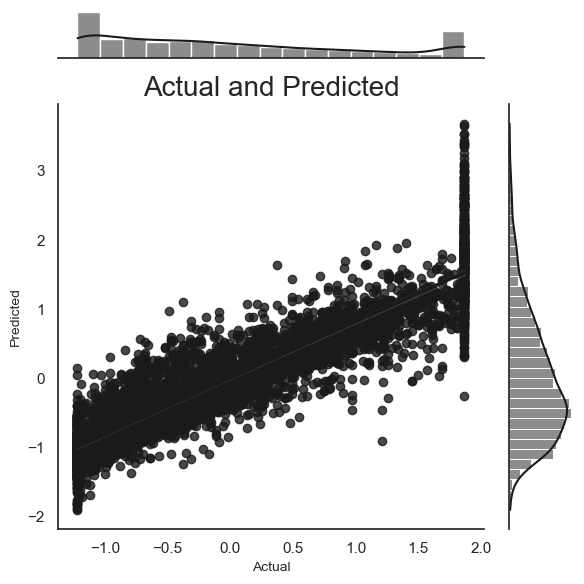

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predL, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Random Forest Regression

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Create the Random Forest Regressor model
rfr_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rfr_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Make predictions on the test data
Y_predRF = rfr_model.predict(X_test)

# Evaluate the model
mseRF = mean_squared_error(y_test, Y_predRF)
rmseRF = np.sqrt(mseRF)

# Calculate R-Squared and Adjusted R-Squared
r2RF = r2_score(y_test, Y_predRF)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2RF = 1 - (1 - r2RF) * (n - 1) / (n - p - 1)

resultsRF=pd.DataFrame({'Method':['Random Forest Model'],'Accuracy on Training':rfr_model.score(X_train,y_train),'Accuracy on Testing':rfr_model.score(X_test,y_test),'RMSE': rmseRF, 'Adjusted R Squared':adj_r2RF,'MSE': mseRF,'R2 Score':r2RF})
results = pd.concat([results, resultsRF])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94


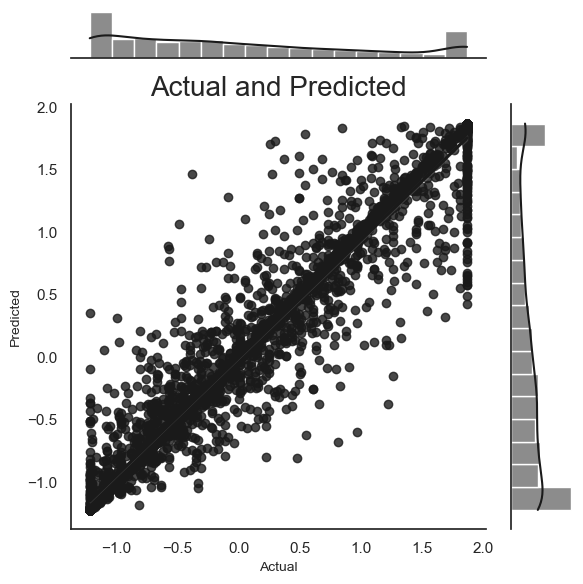

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predRF, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Use K Fold cross validation to measure accuracy of our Random Forest model

In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(RandomForestRegressor(), X, y, cv=cv)

array([0.94050247, 0.93867597, 0.94501158, 0.94648313, 0.94298968])

## KNN Regression

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
# Initialize and train the KNN Regressor
knn_model = KNeighborsRegressor(n_neighbors=6)  # You can choose a different number of neighbors
knn_model.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=6)

In [ ]:
# Make predictions on the test data
Y_predKNN = knn_model.predict(X_test)

# Evaluate the model
mseKNN = mean_squared_error(y_test, Y_predKNN)
rmseKNN = np.sqrt(mseKNN)

# Calculate R-Squared and Adjusted R-Squared
r2KNN = r2_score(y_test, Y_predKNN)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2KNN = 1 - (1 - r2KNN) * (n - 1) / (n - p - 1)

resultsKNN=pd.DataFrame({'Method':['KNN Reg Model'],'Accuracy on Training':knn_model.score(X_train,y_train),'Accuracy on Testing':knn_model.score(X_test,y_test),'RMSE': rmseKNN, 'Adjusted R Squared':adj_r2KNN,'MSE': mseKNN,'R2 Score':r2KNN})
results = pd.concat([results, resultsKNN])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83


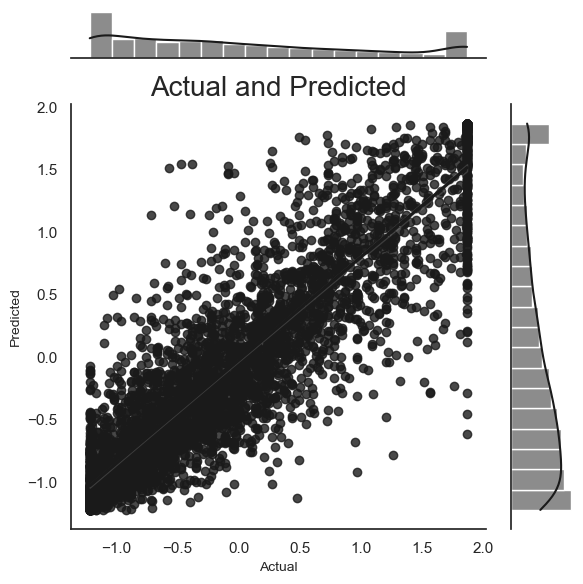

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predKNN, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Decision Tree Regression

In [ ]:
from sklearn.tree import DecisionTreeRegressor
# Initialize and train the Decision tree model
dec_model = DecisionTreeRegressor()
dec_model.fit(X_train,y_train)

DecisionTreeRegressor()

In [ ]:
# Make predictions on the test data
Y_predD = dec_model.predict(X_test)

# Evaluate the model
mseD = mean_squared_error(y_test, Y_predD)
rmseD = np.sqrt(mseD)

# Calculate R-Squared and Adjusted R-Squared
r2D = r2_score(y_test, Y_predD)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2D = 1 - (1 - r2D) * (n - 1) / (n - p - 1)

resultsD=pd.DataFrame({'Method':['Decision Tree Model'],'Accuracy on Training':dec_model.score(X_train,y_train),'Accuracy on Testing':dec_model.score(X_test,y_test),'RMSE': rmseD, 'Adjusted R Squared':adj_r2D,'MSE': mseD,'R2 Score':r2D})
results = pd.concat([results, resultsD])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83
0,Decision Tree Model,1.00,0.89,0.33,0.89,0.11,0.89


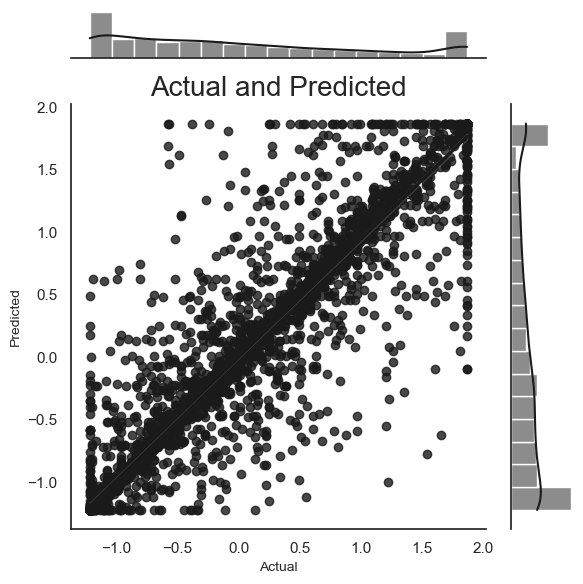

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predD, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Suport Vector Regressor

In [ ]:
from sklearn.svm import SVR
SVR_model = SVR()
SVR_model.fit(X_train, y_train)

SVR()

In [ ]:
# Make predictions on the test data
Y_predSVR = SVR_model.predict(X_test)

# Evaluate the model
mseSVR = mean_squared_error(y_test, Y_predSVR)
rmseSVR = np.sqrt(mseSVR)

# Calculate R-Squared and Adjusted R-Squared
r2SVR = r2_score(y_test, Y_predSVR)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2SVR = 1 - (1 - r2SVR) * (n - 1) / (n - p - 1)

resultsSVR=pd.DataFrame({'Method':['Support Vector Regressor'],'Accuracy on Training':SVR_model.score(X_train,y_train),'Accuracy on Testing':SVR_model.score(X_test,y_test),'RMSE': rmseSVR, 'Adjusted R Squared':adj_r2SVR,'MSE': mseSVR,'R2 Score':r2SVR})
results = pd.concat([results, resultsSVR])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83
0,Decision Tree Model,1.00,0.89,0.33,0.89,0.11,0.89
0,Support Vector Regressor,0.94,0.93,0.27,0.93,0.07,0.93


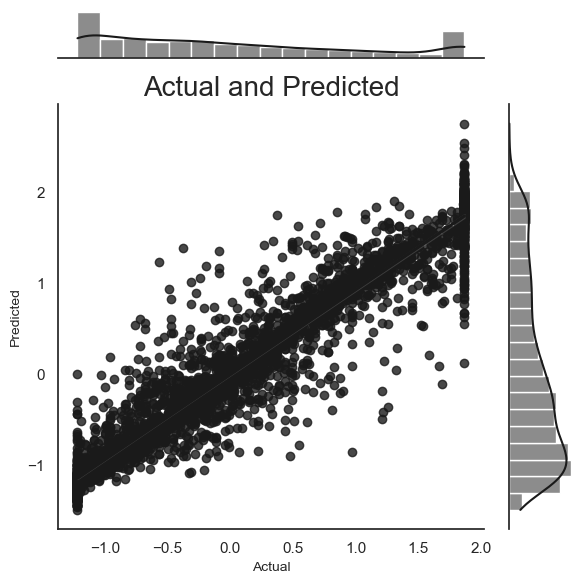

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predSVR, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Gradient Boosting Regression

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
# Initialize and train the Gradient Boosting Regressor
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbr_model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [ ]:
# Make predictions on the test data
Y_predgbr = gbr_model.predict(X_test)

# Evaluate the model
msegbr = mean_squared_error(y_test, Y_predgbr)
rmsegbr = np.sqrt(msegbr)

# Calculate R-Squared and Adjusted R-Squared
r2gbr = r2_score(y_test, Y_predgbr)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2gbr = 1 - (1 - r2gbr) * (n - 1) / (n - p - 1)

resultsgbr=pd.DataFrame({'Method':['Gradient Boosting Regression'],'Accuracy on Training':gbr_model.score(X_train,y_train),'Accuracy on Testing':gbr_model.score(X_test,y_test),'RMSE': rmsegbr, 'Adjusted R Squared':adj_r2gbr,'MSE': msegbr,'R2 Score':r2gbr})
results = pd.concat([results, resultsgbr])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83
0,Decision Tree Model,1.00,0.89,0.33,0.89,0.11,0.89
0,Support Vector Regressor,0.94,0.93,0.27,0.93,0.07,0.93
0,Gradient Boosting Regression,0.93,0.93,0.26,0.93,0.07,0.93


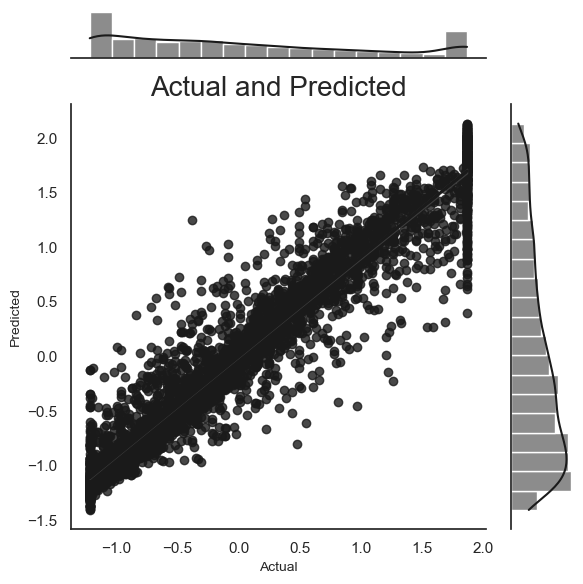

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predgbr, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## XGBoost Regressor

In [ ]:
from xgboost.sklearn import XGBRegressor
# Initialize and train the XGBoosting Regressor
xgb_model=XGBRegressor(objective='reg:squarederror',random_state=6)
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=6, ...)

In [ ]:
# Make predictions on the test data
Y_predxgb = xgb_model.predict(X_test)

# Evaluate the model
msexgb = mean_squared_error(y_test, Y_predxgb)
rmsexgb = np.sqrt(msexgb)

# Calculate R-Squared and Adjusted R-Squared
r2xgb = r2_score(y_test, Y_predxgb)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2xgb = 1 - (1 - r2xgb) * (n - 1) / (n - p - 1)

resultsxgb=pd.DataFrame({'Method':['XGBoost RegressOR'],'Accuracy on Training':xgb_model.score(X_train,y_train),'Accuracy on Testing':xgb_model.score(X_test,y_test),'RMSE': rmsexgb, 'Adjusted R Squared':adj_r2xgb,'MSE': msexgb,'R2 Score':r2xgb})
results = pd.concat([results, resultsxgb])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83
0,Decision Tree Model,1.00,0.89,0.33,0.89,0.11,0.89
0,Support Vector Regressor,0.94,0.93,0.27,0.93,0.07,0.93
0,Gradient Boosting Regression,0.93,0.93,0.26,0.93,0.07,0.93
0,XGBoost RegressOR,0.98,0.94,0.24,0.94,0.06,0.94


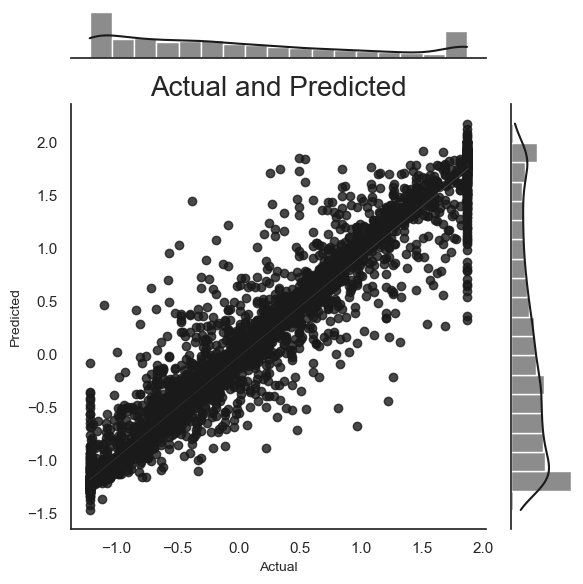

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predxgb, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

## Bagging Regressor

In [ ]:
from sklearn.ensemble import BaggingRegressor
br_model=BaggingRegressor(n_estimators=50, oob_score= True,random_state=14)
br_model.fit(X_train, y_train)

BaggingRegressor(n_estimators=50, oob_score=True, random_state=14)

In [ ]:
# Make predictions on the test data
Y_predbr = br_model.predict(X_test)

# Evaluate the model
msebr = mean_squared_error(y_test, Y_predbr)
rmsebr = np.sqrt(msebr)

# Calculate R-Squared and Adjusted R-Squared
r2br = r2_score(y_test, Y_predbr)
n = X_test.shape[0]  # Number of observations
p = X_test.shape[1]  # Number of predictors
adj_r2br = 1 - (1 - r2br) * (n - 1) / (n - p - 1)

resultsbr=pd.DataFrame({'Method':['Bagging Regressor'],'Accuracy on Training':br_model.score(X_train,y_train),'Accuracy on Testing':br_model.score(X_test,y_test),'RMSE': rmsebr, 'Adjusted R Squared':adj_r2br,'MSE': msebr,'R2 Score':r2br})
results = pd.concat([results, resultsbr])
results=results.round(2)
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83
0,Decision Tree Model,1.00,0.89,0.33,0.89,0.11,0.89
0,Support Vector Regressor,0.94,0.93,0.27,0.93,0.07,0.93
0,Gradient Boosting Regression,0.93,0.93,0.26,0.93,0.07,0.93
0,XGBoost RegressOR,0.98,0.94,0.24,0.94,0.06,0.94
0,Bagging Regressor,0.99,0.94,0.24,0.94,0.06,0.94


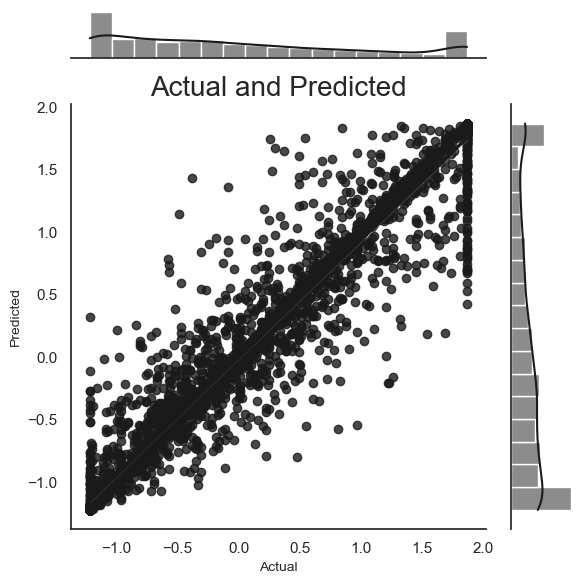

In [ ]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):

    sns.jointplot(x=y_test, y=Y_predbr, kind="reg", color="k")
    plt.title('Actual and Predicted', fontsize=20)       # Plot heading
    plt.xlabel('Actual', fontsize=10)                     # X-label
    plt.ylabel('Predicted', fontsize=10)
    plt.tight_layout()

In [ ]:
results

,Method,Accuracy on Training,Accuracy on Testing,RMSE,Adjusted R Squared,MSE,R2 Score
0,Linear Reg Model,0.82,0.82,0.42,0.82,0.18,0.82
0,Random Forest Model,0.99,0.94,0.24,0.94,0.06,0.94
0,KNN Reg Model,0.89,0.83,0.41,0.83,0.17,0.83
0,Decision Tree Model,1.00,0.89,0.33,0.89,0.11,0.89
0,Support Vector Regressor,0.94,0.93,0.27,0.93,0.07,0.93
0,Gradient Boosting Regression,0.93,0.93,0.26,0.93,0.07,0.93
0,XGBoost RegressOR,0.98,0.94,0.24,0.94,0.06,0.94
0,Bagging Regressor,0.99,0.94,0.24,0.94,0.06,0.94


Top Performers: <br>
Random Forest, XGBoost, and Bagging Regressor show the highest test accuracy (0.94) and the lowest RMSE (0.24) with an R² score of 0.94.<br>
Support Vector Regressor (SVR) and Gradient Boosting Regression also perform well but have slightly higher RMSE (0.27 and 0.26).<br><br>
Overfitting Risk:<br>
Decision Tree Model shows 100% accuracy on training but drops to 0.89 on testing, indicating potential overfitting.<br>
Random Forest and Bagging mitigate overfitting better, maintaining high testing accuracy.<br><br>
Best Model:<br>
XGBoost Regressor, Random Forest Model, and Bagging Regressor are the top choices based on high testing accuracy (0.94) and low RMSE (0.24).<br>
Among these, XGBoost often outperforms others on larger datasets due to its robustness and efficiency.<br>